<a href="https://colab.research.google.com/github/papailth/fashion_product_recommendation_engine/blob/main/Shop_The_Look_Despotis_Papailiou.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

> <a class="anchor" id="00"></a> 



> <img src="https://i.ibb.co/mCs7nGx/BA.jpg" alt="Drawing"  style="width: 1040px;"/>  <br />
>
>
> <img src="https://i.ibb.co/8jhs2qL/Shop-The-Look-8-24-2022.png" alt="Drawing"  style="width: 950px;"/> 
<br />
> <img src="https://i.ibb.co/dgR09sy/shop-the-look-n-final.gif" alt="Drawing" style="width: 862px;"/> 
> <br />
><br />
><b> 
    <font size="+1.3">
> <span style='font-family:Verdana '>🚀 Project: Shop The Look 2022 by Whiskey Team <br />
> <span style='font-family:Verdana '>🚀 Msc in Business Analytics @ AEUB  <br />
>  <span style='font-family:Verdana '>🚀Course: Machine Learning & Content Analytics - Part Time  <br />
>  <span style='font-family:Verdana '>🚀 Professors: H.Papageorgiou | G. Perakis <br />
>  <span style='font-family:Verdana '>🚀 Students: S.Despotis| T.Papailiou <br />
        <font/>
***

 > <img src="https://i.ibb.co/thkLqxq/contents.png" alt="Drawing" style="width: 380px;"/> <br />
><br />
> <img src="https://i.ibb.co/5ryvTFy/7878788.png" alt="Drawing" style="width: 862px;"/>
> <br />
> <br />
> <br />
<font size="+2">
>✅ 00 - [Introduction](#0) <br />
>✅ 01 - [Explanatory Data Analysis](#1) <br />
>✅ 02 - [Gender Classification](#2) <br />
>✅ 03 - [Object Detection](#3) <br />
>✅ 04 - [Extracting Items](#4) <br />
>✅ 05 - [Embeddings Generation](#5) <br />
>✅ 06 - [Final Pipleline](#6) <br />
    </font>
***

<a class="anchor" id="0"></a> 

> <img src="https://i.ibb.co/PDbYHfh/introduction.png" alt="Drawing" style="width: 480px;"/> <br />
><br />
> <img src="https://institute.careerguide.com/wp-content/uploads/2020/10/b1203194834f68bd24fc0aaaf6a74103.gif" alt="Drawing" style="width: 662px;"/>
> <br />
> <br />
> <br />
<font size="+1">
Every day, consumers waste a lot of time on searching for clothes, especially when they know exactly what they want. Since fashion is about the look – combining multiple items together – we thought it would be a great idea to give to users a faster tool to search outfits online, rather than typing multiple textual keywords in search engines. In our case, the adage “A picture is worth a thousand words” was valid, since the images were the “key” solution to our problem. Due to the fact that people are familiar with snaping pictures (e.g. for their social media) and also pictures contain a variety of information, we focused on providing an easy going solution to the users: “Snap and Shop”. We believe that our new tool will give many advantages for customers and online business too. <br />
 <br />
Specifically, for customers the “Shop The Look” tool, will give a personalized user experience, with a fully automated process of matching products to scenes. Having an app which recognizes the clothes of a photo and search for similar products in online stores, will be more practical and time efficient. Secondly, by pointing out relevant alternatives based on what they are looking at, customers could be inspired and discover a much more bigger variety of similar outfits. Thirdly, many times users find they want, but they cant find where to find it online available. Giving that information instantly, will create more enjoyable customer journeys. <br />
<br /> 
For online fashion businesses, the new tool will increase conversion and basket size. When shoppers are better engaged with their brand and its personalized style suggestions, they will probably also increase the frequency of purchases. Secondly, enabling consumers to buy the entire look in the picture with one click, removes the pain of complex human processes and their maintenance. So, companies could save time and costs, from every party that is involved in apparel purchases. Thirdly, the companies can leverage huge amounts of data from users and create detailed reports (e.g. sales performance, user queries) and create personalized landing pages or campaigns.

***


In [ ]:
%%html 
<font size="+5">
<marquee style='width: 50%; color: orange;'><b>👔 👓 LET'S START  👗 👜</b></marquee>

***

<a class="anchor" id="1"></a> 




<img src="https://i.ibb.co/1q50srZ/1.png" alt="Explanatory Data Analysis" style="width: 660px;"/><br /> 

<b> <font size="+3"><span style='font-family:Verdana '> Data Deep-Dive Analysis  <br /></b>


* Importing the required libraries to run the necessary commands later

In [ ]:
from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io
import seaborn as sns
from google.colab import drive
%matplotlib inline

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<b> <font size="+3"><span style='font-family:Verdana '> First things first<br /></b>


>  💡  In the ***Data_Acquisition.ipynb*** notebook provided seperately we have :
>
> 1.   Acquired the data from Skrout's Data Warehouse and saved them to a .csv format with the following columns:
>  - product_id
>  - image_url
>  - description
>  - brand
>  - gender
>  - category
>  - category_name
> 2. Downloaded the images from image_url and saved them locally, in the following sub-folders:
>  - .. /women_topwear/
>  - .. /women_bottomwear/
> - .. /women_footwear/
>  - .. /men_topwear/
>  - .. /men_bottomwear/
>  - .. /men_footwear/


***

>  After compressing the images in Images.zip file , we have uploaded them in Google Drive. We have finaly created a new dataframe column named `path`, with the file path for each image. 

*  We now unzip the file skroutz_images.zip into Google Drive **( No need to run above cell , since the images are already unziped into Google Drive )** 

In [ ]:
#!unzip /content/drive/MyDrive/shop_the_look/skroutz_images.zip

<b> <font size="+3"><span style='font-family:Verdana '> Dataframe<br /></b>


* The dataframe above contains the image paths allong with some description about the products

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/shop_the_look/skroutz_images.csv', usecols = ['product_id','description','brand','gender','category','category_name'])

conditions = [
    (df['gender'] == 'women') & (df['category'] == 'topwear'),
    (df['gender'] == 'women') & (df['category'] == 'bottomwear'),
    (df['gender'] == 'women') & (df['category'] == 'footwear'),
    (df['gender'] == 'men') & (df['category'] == 'topwear'),
    (df['gender'] == 'men') & (df['category'] == 'bottomwear'),
    (df['gender'] == 'men') & (df['category'] == 'footwear')]

choices = ['wtw', 'wbw', 'wft','mtw','mbw','mfw']

df['code'] = np.select(conditions, choices)

df['path'] = df['gender'] + '_' + df['category'] + '/' + df['code'] + '_' + df['product_id'].map(str) + '.jpeg'

df.head()

,product_id,description,brand,gender,category,category_name,code,path
0,30098097,A353 Βραδινό Γυναικείο Top Μαύρο,Awama,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_30098097.jpeg
1,32265292,A288 Off-Shoulder Γυναικείο Top Ροζ,Awama,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_32265292.jpeg
2,29431617,1666 Αμάνικη Γυναικεία Μπλούζα Γκρι,Philosophy Wear,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_29431617.jpeg
3,35677304,1813 Μακρυμάνικο Γυναικείο Βαμβακερό Πουλόβερ ...,Philosophy Wear,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_35677304.jpeg
4,31340241,12200264 Γυναικείο Βαμβακερό Πουλόβερ Blue Iolite,Jack & Jones,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_31340241.jpeg


* We have 9600 images in our database

In [ ]:
len(df)

9600

<b> <font size="+3"><span style='font-family:Verdana '> Categories & Example</b> 


> Below is an example of the product categories for men and women. We have 3 categories for each gender :
- Topwear
- Bottomwear
- Footwear

/content/drive/.shortcut-targets-by-id/1vsUGiCy1Ae86ntI-9MNcOAfl9ZYds24e/shop_the_look


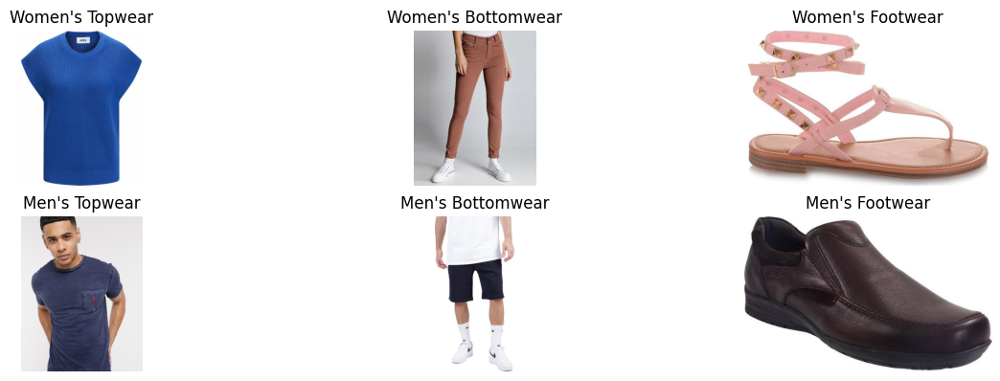

In [ ]:
genders = list(df.gender.unique())
categories = list(df.category.unique())

plt.figure(figsize=(15,15), dpi=100)
i = 1
%cd /content/drive/MyDrive/shop_the_look
for gender in genders:
    for category in categories:
            mdf = df[(df.gender == gender) & (df.category == category)]
            img_url = mdf.path.iloc[4]
            plt.subplot(6,3,i)
            plt.imshow(io.imread(img_url))
            plt.axis("off")
            plt.title(f"{gender}s {category}".title().replace("ns", "n's"))
            i += 1

* The number of products for Men and women almost equally distributed.
5k products for Men and 4.6k products for Women.

<b> <font size="+3"><span style='font-family:Verdana '>Let's Plot</b> 



[Text(0.5, 1.0, 'Products Split by Genders')]

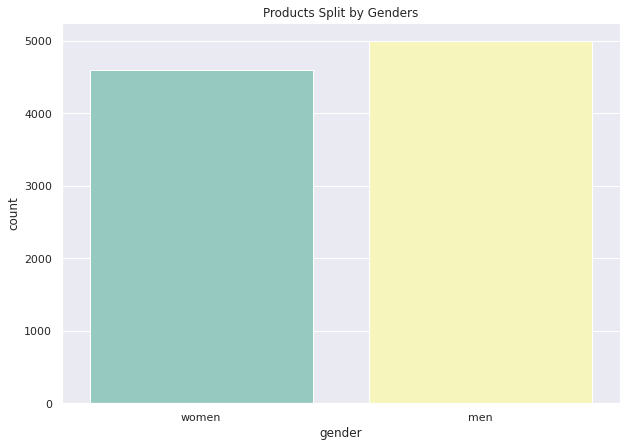

In [ ]:
plt.figure(figsize = (10,7))
sns.set_theme(style="darkgrid")
sns.countplot( x='gender', data=df, palette = "Set3").set(title='Products Split by Genders')

* Topwears are a majority in the dataset with 4k items whereas bottomwears are next up, with around 3.6k. Footwears are a minority in the dataset, having ~2k number of products.

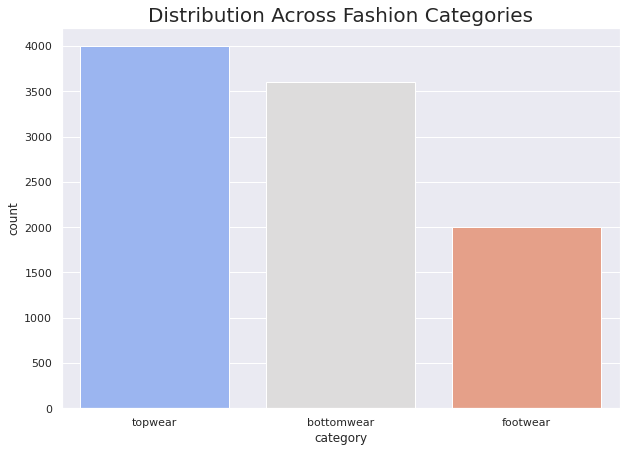

In [ ]:
plt.figure(figsize = (10,7))
sns.set_theme(style="darkgrid")
plt.title('Distribution Across Fashion Categories', fontsize=20)
sns.countplot( x='category', data=df, palette = "coolwarm")

* Here we can observe the distribution across product's categories in the dataset.
Men's bottomwear have 1000 items each, whereas Women's and Men's topwear have 400 products each.

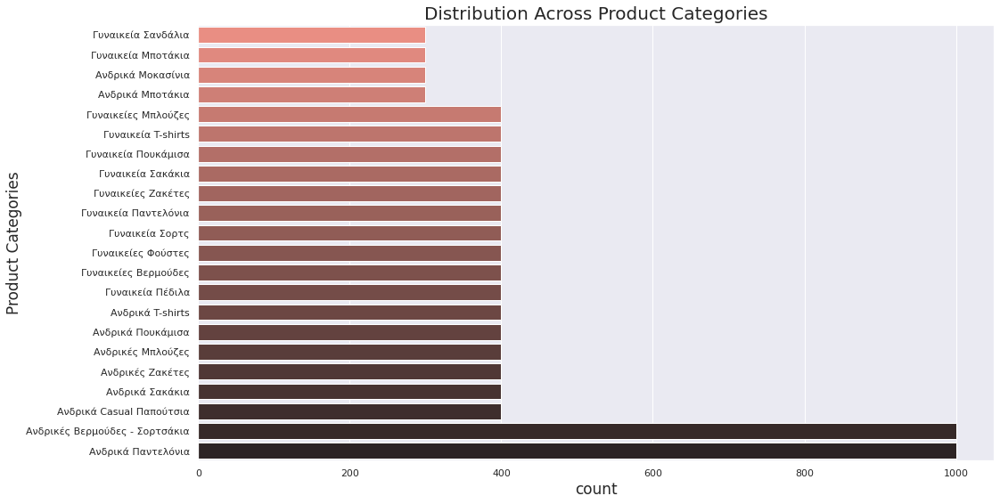

In [ ]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(16,9))
plt.xlabel("2",fontsize=17)
plt.ylabel("Product Categories", fontsize=17)
plt.title('Distribution Across Product Categories', fontsize=20)
sns.countplot(palette ="dark:salmon_r", y=sorted(df.category_name, key=lambda x: df.category_name.value_counts()[x]), orient='v')

* As far as the brands, we can see that Jack & Jones and Ralph Lauren are the most common brands in the dataset, with over 400 products each one.

In [ ]:
print("25 Most Common Brands in the Dataset: ")
df.brand.value_counts()[:10]

25 Most Common Brands in the Dataset: 


Jack & Jones    491
Ralph Lauren    403
BodyTalk        365
Pepe Jeans      343
Edward Jeans    315
Famous Shoes    240
Sogo            186
Body Action     170
Tom Tailor      162
Adidas          161
Name: brand, dtype: int64

***
***

<a class="anchor" id="2"></a> 




<img src="https://i.ibb.co/2j8HPqZ/21.png" alt="Gender Classification" style="width: 660px;"/><br /> 

> <img src="https://i.ibb.co/cD7fRyR/train22.gif" alt="Drawing" style="width: 862px;"/>

<b> <font size="+3"><span style='font-family:Verdana '>Determining Person's  Gender</b> 



> 💡 Code Reference : 

*   https://www.kaggle.com/code/antoreepjana/gender-classification-using-resnet/notebook

In [ ]:
import numpy as np
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.applications import resnet, ResNet50
from tensorflow.keras import metrics, losses, optimizers, callbacks
from tensorflow.keras.layers import Dense, BatchNormalization, Flatten, Dropout
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, f1_score

<b> <font size="+3"><span style='font-family:Verdana '>Dataset</b> 


* 💡 For this task we'll make use of the [Man/Woman classification dataset](https://www.kaggle.com/datasets/playlist/men-women-classification) from Kaggle. This is a manually collected and cleaned dataset containing 3354 pictures (jpg) of men (1414 files) and women (1940 files). After dowloading the data and uploading them to Google Drive, we unzip the file and we create a new folder named gender_classification_dataset that contains the training images for men and women.

**( No need to run above cell , since the gender_classification_dataset is already uploaded into Google Drive )** 

In [ ]:
#!cp "/content/drive/MyDrive/shop_the_look/gender_classification_dataset.zip" "/content/"
#!unzip "gender_classification_dataset.zip"
#!rm "gender_classification_dataset.zip"
#!mv "data/" "gender_classification_dataset/"
#!mv "men/" "gender_classification_dataset/men/"
#!mv "women/" "gender_classification_dataset/women/"

<b> <font size="+3"><span style='font-family:Verdana '>Tensorflow</b> 


* In the cell below we we'll confirm that we can connect to the GPU with tensorflow. 

In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


<b> <font size="+3"><span style='font-family:Verdana '>Model Hyperparameters</b> 


* Next we define our model parameters

In [ ]:
BATCH_SIZE = 32
DROPOUT_RATE = 0.3
EPOCHS = 100
LEARNING_RATE = 1e-3
TARGET_SHAPE = (224,224,3)

<b> <font size="+3"><span style='font-family:Verdana '>Training & Validation Sets</b> 


* We split the dataset into training and validation sets

In [ ]:
%cd  "/content/drive/MyDrive/shop_the_look"
data_dir = 'gender_classification_dataset'
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(data_dir,validation_split=0.2,subset="training",seed=123,image_size=TARGET_SHAPE[:2],batch_size=BATCH_SIZE)
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(data_dir,validation_split=0.2,subset="validation",seed=123,image_size=TARGET_SHAPE[:2],batch_size=BATCH_SIZE)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1 / 255.0)
test_generator = test_datagen.flow_from_directory(directory=data_dir,target_size=TARGET_SHAPE[:2],color_mode="rgb",batch_size=1, class_mode=None,shuffle=False,seed=42)
class_names = train_dataset.class_names

/content/drive/.shortcut-targets-by-id/1vsUGiCy1Ae86ntI-9MNcOAfl9ZYds24e/shop_the_look
Found 6660 files belonging to 2 classes.
Using 5328 files for training.
Found 6660 files belonging to 2 classes.
Using 1332 files for validation.
Found 6618 images belonging to 2 classes.


In [ ]:
class_names = list(test_generator.class_indices.keys())
class_names

['men', 'women']

<b> <font size="+3"><span style='font-family:Verdana '>Subset Plotting</b> 


* We plot subset of the training data

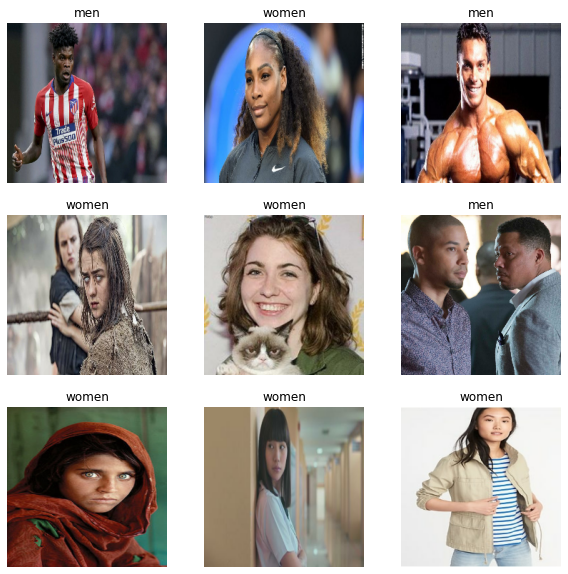

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(class_names[labels[i]])
      plt.axis("off")

<b> <font size="+3"><span style='font-family:Verdana '>"Better performance with the tf.data API"</b> 


* We use the tf.data API since, for achieving peak performance the model requires an efficient input pipeline that delivers data for the next step before the current step has finished

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
tf.keras.backend.clear_session()

<b> <font size="+3"><span style='font-family:Verdana '>ResNET50</b> 


* In the next cell we will built a ResNET50 backbone initialized with 'ImageNet' weights attached to a fully connected network that outputs the probability scores for the two classes
* ResNet50 is a variant of ResNet model which has 48 Convolution layers along with 1 MaxPool and 1 Average Pool layer

In [ ]:
base_model = ResNet50(weights="imagenet", input_shape=TARGET_SHAPE, include_top=False)

for layer in base_model.layers:
    layer.trainable = False

x = Flatten()(base_model.output)
x = Dense(512, activation="relu")(x)
x = Dropout(DROPOUT_RATE)(x)
x = BatchNormalization()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(DROPOUT_RATE)(x)
x = BatchNormalization()(x)

output = Dense(1, activation="sigmoid")(x)

gender_classifier = Model(base_model.input, output, name="Gender_Classifier")
gender_classifier.compile(optimizer=optimizers.SGD(LEARNING_RATE), loss=losses.BinaryCrossentropy(), metrics=["accuracy"])
gender_classifier.summary()

Model: "Gender_Classifier"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                  

<b> <font size="+3"><span style='font-family:Verdana '>Fit The Model - ModelCheckpoint & EarlyStopping</b> 

* We fit the model using ModelCheckpoint to save the weights at some interval, and using EarlyStopping, so to stop training when the val_accuracy metric has stopped improving.

In [ ]:
model_checkpoint = callbacks.ModelCheckpoint("gender_classification_model.h5", monitor="val_accuracy", mode="max", save_best_only=True)
earlystopping = callbacks.EarlyStopping(monitor="val_accuracy", mode="max", patience=10)

history = gender_classifier.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[model_checkpoint, earlystopping])

Epoch 1/100
167/167 [==============================] - 78s 200ms/step - loss: 0.4526 - accuracy: 0.7885 - val_loss: 0.2298 - val_accuracy: 0.9212
Epoch 2/100
167/167 [==============================] - 16s 93ms/step - loss: 0.2445 - accuracy: 0.9058 - val_loss: 0.1816 - val_accuracy: 0.9444
Epoch 3/100
167/167 [==============================] - 17s 99ms/step - loss: 0.1703 - accuracy: 0.9448 - val_loss: 0.1583 - val_accuracy: 0.9527
Epoch 4/100
167/167 [==============================] - 17s 102ms/step - loss: 0.1341 - accuracy: 0.9628 - val_loss: 0.1374 - val_accuracy: 0.9587
Epoch 5/100
167/167 [==============================] - 16s 95ms/step - loss: 0.1063 - accuracy: 0.9754 - val_loss: 0.1220 - val_accuracy: 0.9707
Epoch 6/100
167/167 [==============================] - 13s 77ms/step - loss: 0.0861 - accuracy: 0.9842 - val_loss: 0.1097 - val_accuracy: 0.9707
Epoch 7/100
167/167 [==============================] - 15s 93ms/step - loss: 0.0771 - accuracy: 0.9854 - val_loss: 0.1009 - val_

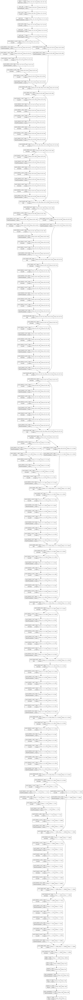

In [ ]:
tf.keras.utils.plot_model(gender_classifier, show_layer_names=True, show_shapes=True)

In [ ]:
training_accuracy_resnet      = history.history['accuracy'][-1]
training_loss_resnet          = history.history['loss'][-1]
validation_accuracy_resnet    = history.history['val_accuracy'][-1]
validation_loss_resnet        = history.history['val_loss'][-1]
print("Training Accuracy ResNet   :", training_accuracy_resnet )
print("Training Loss ResNet       :", training_loss_resnet)
print("Validation Accuracy ResNet :", validation_accuracy_resnet)
print("Validation Loss ResNet     :", validation_loss_resnet)

Training Accuracy ResNet   : 0.9988738894462585
Training Loss ResNet       : 0.02221863903105259
Validation Accuracy ResNet : 0.9729729890823364
Validation Loss ResNet     : 0.06940989196300507


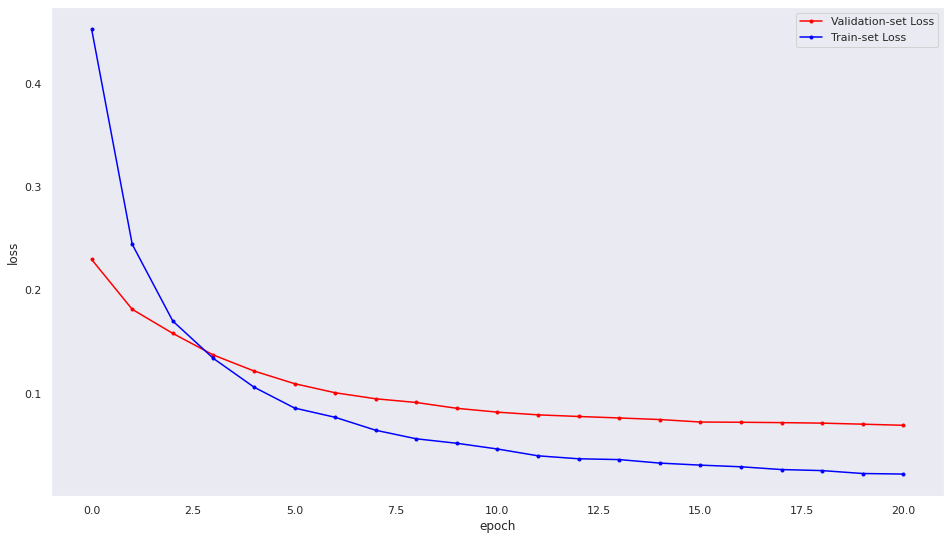

In [ ]:
import numpy

sns.set_theme(style="darkgrid")
y_vloss = history.history['val_loss']
y_loss = history.history['loss']
x_len = numpy.arange(len(y_loss))
plt.figure(figsize=(16,9))
plt.plot(x_len, y_vloss, marker='.', c='red', label="Validation-set Loss")
plt.plot(x_len, y_loss, marker='.', c='blue', label="Train-set Loss")
plt.legend(loc='upper right')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

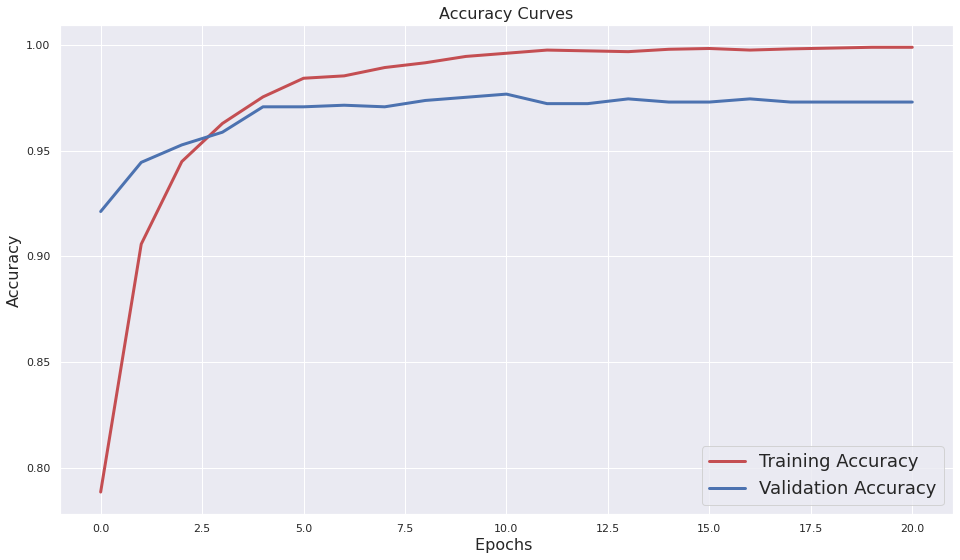

In [ ]:
plt.figure(figsize=[16,9])
plt.plot(history.history['accuracy'],'r',linewidth=3.0)
plt.plot(history.history['val_accuracy'],'b',linewidth=3.0)
plt.legend(['Training Accuracy', 'Validation Accuracy'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Accuracy',fontsize=16)
plt.title('Accuracy Curves',fontsize=16)
plt.show()

<b> <font size="+3"><span style='font-family:Verdana '>Evaluating The Model</b> 


In [ ]:
predictions = gender_classifier.predict(test_generator)
y_test = test_generator.classes

In [ ]:
# function for evaluation metrics precision, recall, f1 etc
def modelEvaluation(predictions, y_test_set, model_name, label):
    # Print model evaluation to predicted result
    print("==========",model_name,"==========")
    print ("\nAccuracy on validation set: {:.4f}".format(accuracy_score(y_test_set, predictions)))
    print ("\nClassification report : \n", classification_report(y_test_set, predictions, target_names=label))
    print ("\nConfusion Matrix : \n", confusion_matrix(y_test_set, predictions))
    plt.figure(figsize=(10,10))
    y_pred = ['men' if i==0 else 'women' for i in predictions]
    y_test = ['men' if i==0 else 'women' for i in y_test_set]
    sns.heatmap(confusion_matrix(y_test, y_pred, labels=label), annot=True, fmt='g',yticklabels=label, xticklabels=label, cmap='viridis')
    plt.tight_layout()
    plt.show()

In [ ]:
modelEvaluation(predictions, y_test, "Gender Classifier", label=class_names)

========== Gender Classifier ==========


ValueError: ignored

<b> <font size="+3"><span style='font-family:Verdana '>Prediction using Test Generator</b> 

In [ ]:
files=test_generator.filenames
class_dict=test_generator.class_indices # a dictionary of the form class name: class index
rev_dict={}
for key, value in class_dict.items():
    rev_dict[value]=key   # dictionary of the form class index: class name


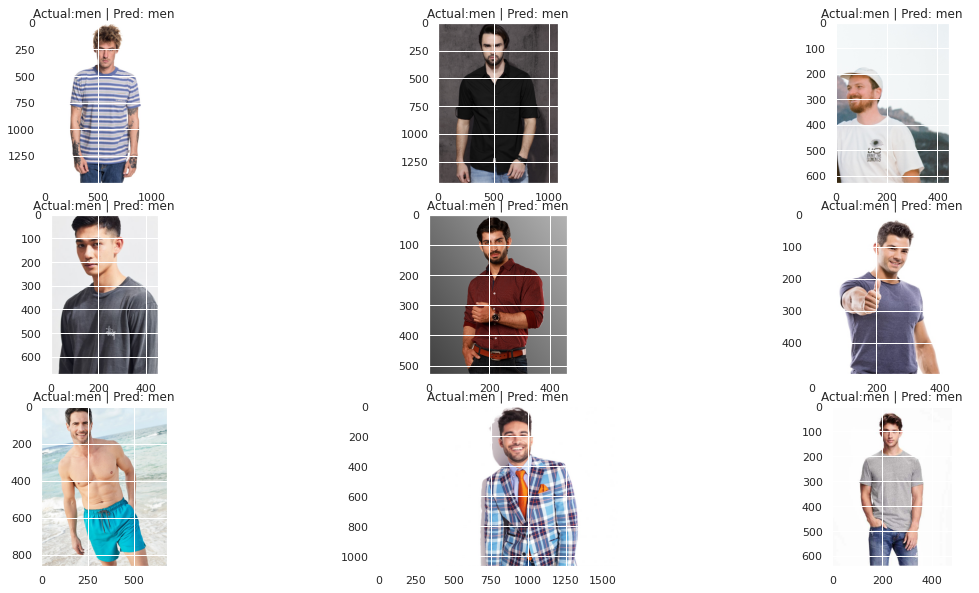

In [ ]:
import cv2, os

plt.figure(figsize=(20,10))
for i, p in enumerate(predictions[:9]):
    plt.subplot(3,3, i+1)
    
    if p[0] <= 0.5:
      plt.title('Actual:' + files[i].split('/')[0] + ' | Pred: men')
    else:
      plt.title('Actual:' + files[i].split('/')[0] + ' | Pred: women')

    img_path = os.path.join(data_dir, files[i])
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)

plt.show()

<b> <font size="+3"><span style='font-family:Verdana '>Saving -> Google Drive</b> 


* We finally save the model weights to Google Drive for further use

In [ ]:
!cp gender_classification_model.h5 /content/drive/MyDrive/shop_the_look/

***
***

<a class="anchor" id="3"></a> 



<img src="https://i.ibb.co/zFXwwcH/3.png" alt="Object Localization" style="width: 660px;"/><br /> 

<b> <font size="+3"><span style='font-family:Verdana '>Using Yolo v5 </b> 

> 💡 Code Reference : 

*   https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb
*   https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

> We'll use YOLO object detection for detecting fashion products in three categories - top wear, bottom wear, and footwear. We will first clone the yolov5 github repository and install the dependencies

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/drive/.shortcut-targets-by-id/1vsUGiCy1Ae86ntI-9MNcOAfl9ZYds24e/shop_the_look/yolov5
     |████████████████████████████████| 1.6 MB 7.0 MB/s 


In [ ]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

* We check if GPU is running

In [ ]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


<b> <font size="+3"><span style='font-family:Verdana '> Roboflow Dataset </b> 

* We will train the yolov5 model using an published Roboflow dataset that has topwear, bottomwear, and footwear annoted images. We first should install and import Roboflow.

In [ ]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 14.5 MB/s 
     |████████████████████████████████| 178 kB 47.8 MB/s 
     |████████████████████████████████| 1.1 MB 50.7 MB/s 
     |████████████████████████████████| 67 kB 4.0 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 138 kB 59.2 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.14-py3-none-any.whl size=24837 sha256=ff081fac282bdfd4202e2fc09a540272305714cdbd49285f7f0e8ea259c24c92
  Stored in directory: /root/.cache/pip/wheels/c7/84/36/a6a32c749ead923690d15d20443fb53fa2fe10beaa408f371b
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=2d74066e9b62bd897eb61317cef7b4ca8f4d7a2968a918a3d8df4d3890e23540
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

* To download and unzip the dataset in yolov5 format from Roboflow, we should run the above cell

In [ ]:
rf = Roboflow(api_key="r6rpj5oyHf5bQdYsqukZ")
project = rf.workspace("new-workspace-w4orl").project("fashion_obj_detection")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/fashion_obj_detection-1 in yolov5pytorch:: 100%|██████████| 372/372 [00:00<00:00, 1913.61it/s]


<b> <font size="+3"><span style='font-family:Verdana '> Training the Model </b> 

* We train the model by running yolov5's train.py. It will download the weights and kick-off training.

In [ ]:
!python train.py --img 640 --batch 2 --epochs 150 --data {dataset.location}/data.yaml --weights /content/yolov5/weights/yolov5s.pt --nosave --cache

* Next up we will visualize the training results

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<b> <font size="+3"><span style='font-family:Verdana '> Model Weights </b> 

* Finally we export our model's weights for future use and rename the file to 'object_detection.pt'

In [ ]:
from google.colab import files
files.download('./runs/train/exp2/weights/last.pt')

* With detect.py we will run our saved weights on our test images and we will be able to visualize them.

In [ ]:
%cd yolov5
!python detect.py --weights /content/drive/MyDrive/shop_the_look/object_detection.pt --img 416 --conf 0.1 --source /content/drive/MyDrive/shop_the_look/test_image_1.jpg
Image(filename='/content/drive/MyDrive/shop_the_look/yolov5/runs/detect/exp/test_image_1.jpg', width=600)

***
***

<a class="anchor" id="4"></a> 



<img src="https://i.ibb.co/n0Pb0q5/4.png" alt="Object Localization" style="width: 660px;"/><br /> 

<b> <font size="+3"><span style='font-family:Verdana '> Extract different clothing items from an image </b> 

> 💡 Code Reference :

*   https://www.youtube.com/watch?v=VmqESKaaYVk&ab_channel=DeepLearning
*   https://github.com/biplob004/codeShare/blob/main/detect.py

> Now we will build a function to detect the topwear, bottomwear and footwear from the input image, and it will output one image for each class detected. First we load the object localization model

In [ ]:
%cd /content/drive/MyDrive/shop_the_look/yolov5
import matplotlib.pyplot as plt
import cv2
%matplotlib inline
import torch
model = torch.hub.load('.', 'custom', path='/content/drive/MyDrive/shop_the_look/object_detection.pt', source='local') 

<b> <font size="+3"><span style='font-family:Verdana '> 2 x Functions </b> 

* The `extract_clothes` function takes as input the path to the image file that we want to extract clothes from and outputs a dictionary containing detected Object Class as Keys and the image slice as Values. In case there are multiple items of the same class, the item with highest confidence score is returned.

* The `plot_clothes` function takes as input the dictionary from `extract_clothes` output and returns an matplotlib.figure object with the detected images in a row.

In [ ]:
def extract_clothes(img_path: str): 
    image = plt.imread(img_path)
    results = model(image_path)
    topwear_score, bottomwear_score, footwear_score = 0.5, 0.5, 0.5
    outputs = {"original_image": image}
    for index, row in results.pandas().xyxy[0].iterrows():
      XMIN = int(row['xmin'])
      YMIN = int(row['ymin']) 
      XMAX = int(row['xmax'])
      YMAX = int(row['ymax'])
      if (row['class'] == 0) and (row['confidence'] > topwear_score) :
          outputs["topwear"] = image[YMIN:YMAX, XMIN:XMAX]
      elif (row['class'] == 1) and (row['confidence'] > bottomwear_score):
          outputs["bottomwear"] = image[YMIN:YMAX, XMIN:XMAX]
      elif (row['class'] == 2) and (row['confidence'] > footwear_score):
          outputs["footwear"] = image[YMIN:YMAX, XMIN:XMAX]
    return outputs

def plot_clothes(**images):
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
      plt.subplot(1, n, i + 1)
      plt.axis("off")
      plt.title(' '.join(name.split('_')).title())
      plt.imshow(image)
    plt.show()

<b> <font size="+3"><span style='font-family:Verdana '> | Example A </b> 

* Lets see 2 examples below

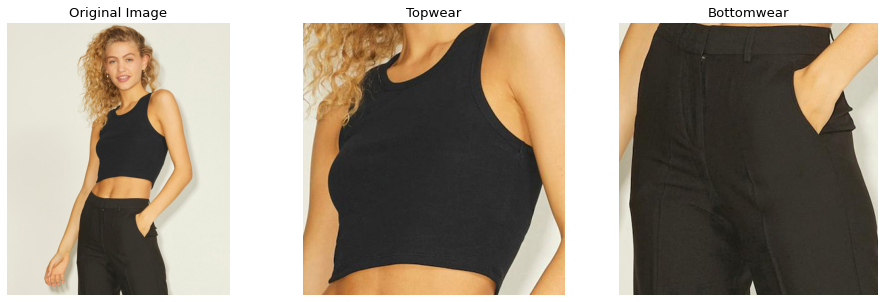

In [ ]:
image_path = '/content/drive/MyDrive/shop_the_look/' + df.path.iloc[96]
outputs = extract_clothes(image_path)
plot_clothes(**outputs)

<b> <font size="+3"><span style='font-family:Verdana '> | Example B </b> 

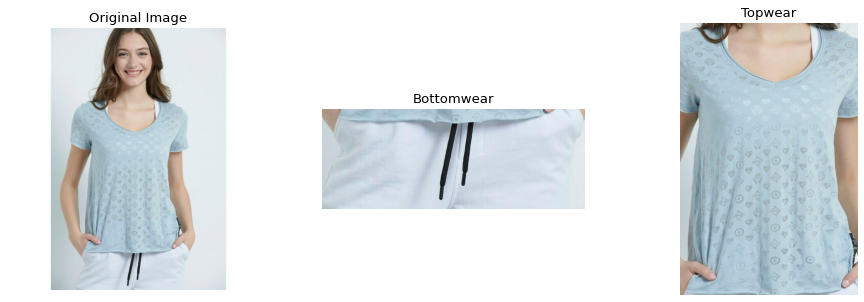

In [ ]:
image_path = '/content/drive/MyDrive/shop_the_look/' + df.path.iloc[156]
outputs = extract_clothes(image_path)
plot_clothes(**outputs)

<b> <font size="+3"><span style='font-family:Verdana '> Runtime Results </b> 

 * The runtime speed of the pipeline above is on average 62.4 ms 

In [ ]:
%%timeit
outputs = extract_clothes(image_path)

62.4 ms ± 649 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


***
***

<a class="anchor" id="5"></a> 



<img src="https://i.ibb.co/Nn5m3JW/5.png" alt="Embeddings Generation" style="width: 860px;"/><br /> 

<b> <font size="+3"><span style='font-family:Verdana '> Dataset: "Shop The Look" </b> 

> 💡 Code Reference: 


1.   https://github.com/kang205/STL-Dataset



* We use embedding generation to represent images/products such that similar ones are grouped together whereas dissimilar ones are moved away so that in order to retrieve products that are similar to the products present in the query image

In [ ]:
import os, cv2, shutil, random
import json
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
from skimage import io
from PIL import Image
from matplotlib import pyplot as plt
%matplotlib inline

* In order to convert images to n-dimensional vector representations of the images, we'll use a special type of Neural Network called Siamese Network. This network which takes in three inputs - anchor, positive and negative, such that anchor, and positive inputs are similar whereas anchor and negative inputs are dissimilar. 

* "Shop The Look" is a dataset which provides with scene and product pairs. Product is an image of a product in professional setting whereas a scene is the image of the same product but in casual or non-professional setting. We can easily create anchor and positive pairs from this dataset 

<b> <font size="+3"><span style='font-family:Verdana '> Clone Repo </b> 

* We first clone the shop_the_look github repo in order to dowload the data.  https://github.com/kang205/STL-Dataset

In [ ]:
%cd  "/content/drive/MyDrive/shop_the_look"
!git clone https://github.com/kang205/STL-Dataset  # clone repo
%cd STL-Dataset

/content/drive/MyDrive/shop_the_look
fatal: destination path 'STL-Dataset' already exists and is not an empty directory.
/content/drive/MyDrive/shop_the_look/STL-Dataset


In [ ]:
stl_dataset = "/content/drive/MyDrive/shop_the_look/STL-Dataset"
files = [os.path.join(stl_dataset, x) for x in os.listdir(stl_dataset) if (x.endswith("fashion-cat.json") | x.endswith("fashion.json"))]

In [ ]:
with open(files[0], "r") as f:
  categories = json.load(f)

<b> <font size="+3"><span style='font-family:Verdana '>2 x Functions </b> 

* `convert_to_url` function takes as input the signature of the image and returns the url. `categorize` function categorizes the products into 3 broad categories - Topwear, Bottomwear and Footwear

In [ ]:
def convert_to_url(signature):
    prefix = 'http://i.pinimg.com/400x/%s/%s/%s/%s.jpg'
    return prefix % (signature[0:2], signature[2:4], signature[4:6], signature)

def categorize(x):
    if x == 'Shoes':
        return 'footwear'
    elif x in ['Clothing|Pants', 'Clothing|Shorts', 'Clothing|Skirts']:
        return 'bottomwear'
    else:
        return 'topwear'


<b> <font size="+3"><span style='font-family:Verdana '> Dataframe </b> 

* We read the data and convert them to a dataframe

In [ ]:
data = [json.loads(line) for line in open(files[1], 'r')]
data = pd.DataFrame(data)
data.head()

,product,scene,bbox
0,0027e30879ce3d87f82f699f148bff7e,cdab9160072dd1800038227960ff6467,"[0.434097, 0.859363, 0.560254, 1.0]"
1,0027e30879ce3d87f82f699f148bff7e,14f59334af4539132981b1324a731067,"[0.175269, 0.527773, 0.621485, 0.924899]"
2,0027e30879ce3d87f82f699f148bff7e,e7d32df9f45b691afc580808750f73ca,"[0.588666, 0.638503, 0.750647, 0.761368]"
3,0027e30879ce3d87f82f699f148bff7e,c0be585ed21b1a6c6dc9559ebe007ede,"[0.276699, 0.757741, 0.400485, 0.876138]"
4,002a6586b8381b5efd39410657630b44,67ed2a06be8a26dc63d7a04d4e1a135f,"[0.154545, 0.144809, 0.809091, 0.784153]"


<b> <font size="+3"><span style='font-family:Verdana '> Replacing Signatures & Scene Columns </b> 

* We replace the signatures in product and scene colums with the url, and we categorize each product based on the function mentioned above. We finally split the bounding box coordinates into 4 different columns

In [ ]:
data = [json.loads(line) for line in open(files[1], 'r')]
data = pd.DataFrame(data)
data['category'] = data['product'].apply(lambda x: categories[x].replace('Apparel & Accessories|', ''))
data = data[data['category'].apply(lambda x: True if ('Clothing' in x) or ('Shoes' in x) else False)]
data = data[data['category'].apply(lambda x: True if ('Sunglasses' not in x) else False)]
data['category'] = data['category'].apply(lambda x: categorize(x))
data['product'] = data['product'].apply(lambda x: convert_to_url(x))
data['scene'] = data['scene'].apply(lambda x: convert_to_url(x))
data['XMIN'] = data['bbox'].apply(lambda x: x[0])
data['YMIN'] = data['bbox'].apply(lambda x: x[1])
data['XMAX'] = data['bbox'].apply(lambda x: x[2])
data['YMAX'] = data['bbox'].apply(lambda x: x[3])
data = data.drop(["bbox"], axis=1)
print("Total Pairs", data.shape[0])
data.head()

Total Pairs 58364


,product,scene,category,XMIN,YMIN,XMAX,YMAX
0,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/cd/ab/91/cdab9160072d...,footwear,0.434097,0.859363,0.560254,1.000000
1,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/14/f5/93/14f59334af45...,footwear,0.175269,0.527773,0.621485,0.924899
2,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/e7/d3/2d/e7d32df9f45b...,footwear,0.588666,0.638503,0.750647,0.761368
3,http://i.pinimg.com/400x/00/27/e3/0027e30879ce...,http://i.pinimg.com/400x/c0/be/58/c0be585ed21b...,footwear,0.276699,0.757741,0.400485,0.876138
5,http://i.pinimg.com/400x/00/f9/27/00f9272f652f...,http://i.pinimg.com/400x/b6/9e/7f/b69e7fd5c674...,bottomwear,0.319045,0.409877,0.724975,0.865827


* We have 31249 Unique Products and 25799 Unique Scenes, meaning that different products can appear in the same scene.

In [ ]:
print("Number of Unique Products:\t", data["product"].nunique())
print("Number of Unique Scenes:\t", data["scene"].nunique())

Number of Unique Products:	 31249
Number of Unique Scenes:	 25799


<b> <font size="+3"><span style='font-family:Verdana '> Product Categories Distribution </b> 

* The product categories are distributed as following:

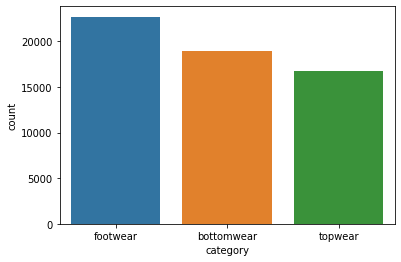

In [ ]:
sns.countplot(data.category)
plt.show()

In [ ]:
topwear = data[data['category'] == 'topwear'].reset_index(drop=True)
bottomwear = data[data['category'] == 'bottomwear'].reset_index(drop=True)
footwear = data[data['category'] == 'footwear'].reset_index(drop=True)

<b> <font size="+3"><span style='font-family:Verdana '>3 x Functions </b> 

* The `download_images` function downloads the images by using the URL and saves them locally. `create_negative` function selects a random image from the same category that will act as a negative sample. `plot_samples` function plots Anchor, Positive and Negative images in a row for a given batch of images.

In [ ]:
def download_images(dataframe, target_folder):  
    embeddings_dir = "embeddings_train_data"
    data = list()
    if not os.path.exists(embeddings_dir):
        os.mkdir(embeddings_dir)
    for i, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
        try:
            product_url, product_name = row["product"], row["product"].split("/")[-1]
            scene_url, scene_name = row["scene"], row["scene"].split("/")[-1]
            target_dir = os.path.join(embeddings_dir, target_folder)
            if not os.path.exists(target_dir):
                os.mkdir(target_dir)
                os.mkdir(os.path.join(target_dir, "anchor"))
                os.mkdir(os.path.join(target_dir, "positive"))
            if not os.path.isfile(os.path.join(target_dir, "anchor", product_name)):
                product = Image.fromarray(io.imread(product_url))
                product.save(os.path.join(target_dir, "anchor", product_name))
            if not os.path.isfile(os.path.join(target_dir, "positive", scene_name)):
                scene = io.imread(scene_url)
                XMIN, YMIN, XMAX, YMAX = int(scene.shape[1] * row['XMIN']), int(scene.shape[0] * row['YMIN']), int(scene.shape[1] * row['XMAX']), int(scene.shape[0] * row['YMAX']) 
                scene = Image.fromarray(scene[YMIN:YMAX, XMIN:XMAX])
                scene.save(os.path.join(target_dir, "positive", scene_name))
            data.append((os.path.join(target_dir, "anchor", product_name), os.path.join(target_dir, "positive", scene_name)))
        except Exception as e:
            print(f"Error: {e}")
            continue
    return data

def create_negative(List, positive):
    negative = random.choice(List)
    if negative != positive:
        return negative
    else:
        create_negative(List, positive)
        
def plot_samples(dataframe, size=4, random_state=4):
    for _, row in dataframe.sample(n=size, random_state=random_state).iterrows():
        anchor, positive, negative = row["anchor"], row["positive"], row["negative"] 
        anchor, positive, negative = io.imread(anchor), io.imread(positive), io.imread(negative)
        plt.figure(figsize=(16,9))
        plt.subplot(131)
        plt.imshow(anchor)
        plt.axis("off"); plt.title("Anchor")
        plt.subplot(132)
        plt.imshow(positive)
        plt.axis("off"); plt.title("Positive")
        plt.subplot(133)
        plt.imshow(negative)
        plt.axis("off"); plt.title("Negative")
        plt.show() 

<b> <font size="+3"><span style='font-family:Verdana '>Download & Save  </b> 

* We download and save the images in /content/drive/MyDrive/shop_the_look/STL-Dataset/embeddings_train_data for Topwear, Bottomwear, and Footwear in separate folders, and we finally create a csv with anchor, positive and negative image paths.

<b> <font size="+3"><span style='font-family:Verdana '> Topwear  </b>

In [ ]:
top_pairs = download_images(topwear, "topwear")

In [ ]:
top_pairs_csv = pd.DataFrame(top_pairs, columns=["anchor", "positive"])
top_pairs_csv["negative"] = top_pairs_csv["positive"].apply(lambda x: create_negative(top_pairs_csv.positive.to_list(), x)) 
print("Total Pairs: ", top_pairs_csv.shape[0])
top_pairs_csv.to_csv("top_pairs.csv", index=False)

In [ ]:
plot_samples(top_pairs_csv, size=3, random_state=31)

<b> <font size="+3"><span style='font-family:Verdana '>Bottomwear </b> 

In [ ]:
bottom_pairs = download_images(bottomwear, "bottomwear")

In [ ]:
bottom_pairs_csv = pd.DataFrame(bottom_pairs, columns=["anchor", "positive"])
bottom_pairs_csv["negative"] = bottom_pairs_csv["positive"].apply(lambda x: create_negative(bottom_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", bottom_pairs_csv.shape[0])
bottom_pairs_csv.to_csv("bottom_pairs.csv", index=False)

In [ ]:
plot_samples(bottom_pairs_csv, size=3, random_state=99)

<b> <font size="+3"><span style='font-family:Verdana '>Footwear </b> 

In [ ]:
foot_pairs = download_images(footwear, "footwear")

In [ ]:
foot_pairs_csv = pd.DataFrame(foot_pairs, columns=["anchor", "positive"])
foot_pairs_csv["negative"] = foot_pairs_csv["positive"].apply(lambda x: create_negative(foot_pairs_csv.positive.to_list(), x))
print("Total Pairs: ", foot_pairs_csv.shape[0])
foot_pairs_csv.to_csv("foot_pairs.csv", index=False)

In [ ]:
plot_samples(foot_pairs_csv, size=3, random_state=99)

<b> <font size="+3"><span style='font-family:Verdana '>Embeddings-Generation </b> 


> 💡 Code Reference:

*   https://keras.io/examples/vision/siamese_network/

<b> <font size="+3"><span style='font-family:Verdana '>Siamese Network </b> 


* Now it is time to train our Siamese network to represent images/products such that similar ones are grouped together whereas dissimilar ones are moved away

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
from pathlib import Path
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import metrics
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import resnet, resnet_v2, ResNet50, ResNet50V2, EfficientNetB3, InceptionV3, InceptionResNetV2

In [ ]:
import os
import pandas as pd
embeddings_dir = "embeddings_train_data"
if not os.path.isdir(embeddings_dir):    
    from google.colab import drive
    drive.mount('/content/drive')
    !cp "/content/drive/MyDrive/shop_the_look/STL-Dataset/embeddings_train_data" "/content/"
    !cp "/content/drive/MyDrive/shop_the_look/STL-Dataset/top_pairs.csv" "/content/"
    !cp "/content/drive/MyDrive/shop_the_look/STL-Dataset/bottom_pairs.csv" "/content/"
    !cp "/content/drive/MyDrive/shop_the_look/STL-Dataset/foot_pairs.csv" "/content/"
    print("Data Loaded Successfully!")
else:
    print("Data already loaded!")

Data already loaded!


In [ ]:
def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    return image


def preprocess_triplets(anchor, positive, negative):
    """
    Given the filenames corresponding to the three images,
    preprocess them.
    """
    return preprocess_image(anchor), preprocess_image(positive), preprocess_image(negative)

def visualize(anchor, positive, negative, n=3):
    """Visualize triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(3*n, 9))

    axs = fig.subplots(n, 3)
    for i in range(n):
        show(axs[i, 0], anchor[i])
        show(axs[i, 1], positive[i])
        show(axs[i, 2], negative[i])

In [ ]:
BATCH_SIZE = 32
LEARNING_RATE = 1e-4
TARGET_SHAPE = (224, 224, 3)
EMBEDDING_DIMENSION = 256
EPOCHS = 100

In [ ]:
tf.keras.backend.clear_session()

base_model = ResNet50(weights="imagenet", input_shape=TARGET_SHAPE, include_top=False)

for layer in base_model.layers:
    layer.trainable = True

x = Flatten()(base_model.output)
x = Dense(512, activation="relu")(x)
x = BatchNormalization()(x)
x = Dense(256, activation="relu")(x)
x = BatchNormalization()(x)

output = Dense(EMBEDDING_DIMENSION, activation="linear")(x)

embedding = Model(base_model.input, output, name="Embedding")

In [ ]:
class DistanceLayer(tf.keras.layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

anchor_input = Input(name="anchor", shape=TARGET_SHAPE)
positive_input = Input(name="positive", shape=TARGET_SHAPE)
negative_input = Input(name="negative", shape=TARGET_SHAPE)

distances = DistanceLayer()(embedding(resnet.preprocess_input(anchor_input)), embedding(resnet.preprocess_input(positive_input)), embedding(resnet.preprocess_input(negative_input)))

siamese_network = Model(inputs=[anchor_input, positive_input, negative_input], outputs=distances)

In [ ]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        ap_distance, an_distance = self.siamese_network(data)
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        return [self.loss_tracker]

* We will fit the Siamese Network for each one of the topwear, botomwear and footwear, and save the embeddings in topwear_embedding.h5, bottomwear_embedding.h5, and footwear_embedding.h5.

<b> <font size="+3"><span style='font-family:Verdana '>Train-Topwear </b> 


In [ ]:
%cd /content/drive/MyDrive/shop_the_look/STL-Dataset/
dataframe = pd.read_csv("top_pairs.csv")
dataframe.negative.fillna(dataframe.negative.mode()[0], inplace=True)
for column in dataframe.columns:
    dataframe[column] = dataframe[column].apply(lambda x: x.replace("\\","/")) 

anchor_images = dataframe.anchor.to_list()
positive_images = dataframe.positive.to_list()
negative_images = dataframe.negative.to_list()
image_count = len(anchor_images)

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_images)
positive_dataset = tf.data.Dataset.from_tensor_slices(positive_images)
negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=1024)
dataset = dataset.map(preprocess_triplets)

train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(BATCH_SIZE, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

In [ ]:
visualize(*list(train_dataset.take(7).as_numpy_iterator())[0])

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True)]

In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(LEARNING_RATE))
siamese_model.fit(train_dataset, epochs=EPOCHS, validation_data=val_dataset, callbacks=callbacks)

In [ ]:
sample = next(iter(train_dataset))
anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (embedding(resnet.preprocess_input(anchor)), embedding(resnet.preprocess_input(positive)), embedding(resnet.preprocess_input(negative)),)

In [ ]:
anchors, positives, negatives = sample
for i in range(len(anchor_embedding)):
    anchor, positive, negative = anchors[i], positives[i], negatives[i]
    positive_distance = np.linalg.norm(anchor_embedding[i] - positive_embedding[i], ord=2)*1e4
    negative_distance = np.linalg.norm(anchor_embedding[i] - negative_embedding[i], ord=2)*1e4
    positive_distance, negative_distance = round(positive_distance)/1e4, round(negative_distance)/1e4
    plt.figure(figsize=(16,9))
    plt.subplot(131)
    plt.imshow(anchor)
    plt.axis("off")
    plt.title("Anchor")
    plt.subplot(132)
    plt.imshow(positive)
    plt.axis("off")
    plt.title(f"Anchor to Positive Distance: {positive_distance}")
    plt.subplot(133)
    plt.imshow(negative)
    plt.axis("off")
    plt.title(f"Anchor to Negative Distance: {negative_distance}")
    plt.show()        

In [ ]:
embedding.save("topwear_embedding.h5")
!cp topwear_embedding.h5 /content/drive/MyDrive/shop_the_look/

<b> <font size="+3"><span style='font-family:Verdana '>Train-Bottomwear </b> 


In [ ]:
dataframe = pd.read_csv("bottom_pairs.csv")
dataframe.negative.fillna(dataframe.negative.mode()[0], inplace=True)
for column in dataframe.columns:
    dataframe[column] = dataframe[column].apply(lambda x: x.replace("\\","/")) 

anchor_images = dataframe.anchor.to_list()
positive_images = dataframe.positive.to_list()
negative_images = dataframe.negative.to_list()
image_count = len(anchor_images)

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_images)
positive_dataset = tf.data.Dataset.from_tensor_slices(positive_images)
negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=1024)
dataset = dataset.map(preprocess_triplets)

train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(BATCH_SIZE, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

In [ ]:
visualize(*list(train_dataset.take(11).as_numpy_iterator())[0])

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True)]

In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(LEARNING_RATE))
siamese_model.fit(train_dataset, epochs=EPOCHS, validation_data=val_dataset, callbacks=callbacks)

In [ ]:
sample = next(iter(train_dataset))
anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (embedding(resnet.preprocess_input(anchor)), embedding(resnet.preprocess_input(positive)), embedding(resnet.preprocess_input(negative)),)

In [ ]:
anchors, positives, negatives = sample
for i in range(len(anchor_embedding)):
    anchor, positive, negative = anchors[i], positives[i], negatives[i]
    positive_distance = np.linalg.norm(anchor_embedding[i] - positive_embedding[i], ord=2)*1e4
    negative_distance = np.linalg.norm(anchor_embedding[i] - negative_embedding[i], ord=2)*1e4
    positive_distance, negative_distance = round(positive_distance)/1e4, round(negative_distance)/1e4
    plt.figure(figsize=(16,9))
    plt.subplot(131)
    plt.imshow(anchor)
    plt.axis("off")
    plt.title("Anchor")
    plt.subplot(132)
    plt.imshow(positive)
    plt.axis("off")
    plt.title(f"Anchor to Positive Distance: {positive_distance}")
    plt.subplot(133)
    plt.imshow(negative)
    plt.axis("off")
    plt.title(f"Anchor to Negative Distance: {negative_distance}")
    plt.show()   

In [ ]:
embedding.save("bottomwear_embedding.h5")

In [ ]:
!cp bottomwear_embedding.h5 /content/drive/MyDrive/shop_the_look/

<b> <font size="+3"><span style='font-family:Verdana '>Train-Footwear </b> 


In [ ]:
dataframe = pd.read_csv("foot_pairs.csv")
dataframe.negative.fillna(dataframe.negative.mode()[0], inplace=True)
for column in dataframe.columns:
    dataframe[column] = dataframe[column].apply(lambda x: x.replace("\\","/")) 

anchor_images = dataframe.anchor.to_list()
positive_images = dataframe.positive.to_list()
negative_images = dataframe.negative.to_list()
image_count = len(anchor_images)

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_images)
positive_dataset = tf.data.Dataset.from_tensor_slices(positive_images)
negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=1024)
dataset = dataset.map(preprocess_triplets)

train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(BATCH_SIZE, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

In [ ]:
visualize(*list(train_dataset.take(2).as_numpy_iterator())[0])


In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True)]


In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(LEARNING_RATE))
siamese_model.fit(train_dataset, epochs=EPOCHS, validation_data=val_dataset, callbacks=callbacks)

In [ ]:
sample = next(iter(train_dataset))
anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (embedding(resnet.preprocess_input(anchor)), embedding(resnet.preprocess_input(positive)), embedding(resnet.preprocess_input(negative)),)

In [ ]:
anchors, positives, negatives = sample
for i in range(len(anchor_embedding)):
    anchor, positive, negative = anchors[i], positives[i], negatives[i]
    positive_distance = np.linalg.norm(anchor_embedding[i] - positive_embedding[i], ord=2)*1e4
    negative_distance = np.linalg.norm(anchor_embedding[i] - negative_embedding[i], ord=2)*1e4
    positive_distance, negative_distance = round(positive_distance)/1e4, round(negative_distance)/1e4
    plt.figure(figsize=(16,9))
    plt.subplot(131)
    plt.imshow(anchor)
    plt.axis("off")
    plt.title("Anchor")
    plt.subplot(132)
    plt.imshow(positive)
    plt.axis("off")
    plt.title(f"Anchor to Positive Distance: {positive_distance}")
    plt.subplot(133)
    plt.imshow(negative)
    plt.axis("off")
    plt.title(f"Anchor to Negative Distance: {negative_distance}")
    plt.show()   

In [ ]:
embedding.save("footwear_embedding.h5")

In [ ]:
!cp footwear_embedding.h5 /content/drive/MyDrive/shop_the_look/

<b> <font size="+3"><span style='font-family:Verdana '>Embedding-Generation(Inference) </b> 


* Now it is time to generate the embeddings for our database/catologue Skroutz images

In [ ]:
import os
import numpy as np
import random
import pandas as pd
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import resnet
import matplotlib.pyplot as plt
from PIL import Image
from skimage import io

* We will create the `preprocess_image` function to load the specified file as a JPEG image, preprocess it and resize it to the target shape. `generate_embedding` function uses the specified dataframe and embeddings model to calculate embeddings for all records in the dataframe

In [ ]:
TARGET_SHAPE = (224,224,3)
def preprocess_image(filename: str):
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    image = resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0)


def generate_embedding(dataframe, embedding_generator):
    embeddings = list()
    for i, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
        filename = row["image_path"]
        image = preprocess_image(filename)
        embedding = embedding_generator(image)
        embeddings.append(embedding[0].numpy().astype(np.float32).tolist())
    dataframe["embedding"] = embeddings
    return dataframe

<b> <font size="+3"><span style='font-family:Verdana '>Skroutz.gr Images Dataframe </b> 


* Below is the Skrout images dataframe

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/shop_the_look/skroutz_images.csv', usecols = ['product_id','description','brand','gender','category','category_name'])

conditions = [
    (df['gender'] == 'women') & (df['category'] == 'topwear'),
    (df['gender'] == 'women') & (df['category'] == 'bottomwear'),
    (df['gender'] == 'women') & (df['category'] == 'footwear'),
    (df['gender'] == 'men') & (df['category'] == 'topwear'),
    (df['gender'] == 'men') & (df['category'] == 'bottomwear'),
    (df['gender'] == 'men') & (df['category'] == 'footwear')]

choices = ['wtw', 'wbw', 'wft','mtw','mbw','mfw']

df['code'] = np.select(conditions, choices)

df['image_path'] = df['gender'] + '_' + df['category'] + '/' + df['code'] + '_' + df['product_id'].map(str) + '.jpeg'

df.head()

,product_id,description,brand,gender,category,category_name,code,image_path
0,30098097,A353 Βραδινό Γυναικείο Top Μαύρο,Awama,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_30098097.jpeg
1,32265292,A288 Off-Shoulder Γυναικείο Top Ροζ,Awama,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_32265292.jpeg
2,29431617,1666 Αμάνικη Γυναικεία Μπλούζα Γκρι,Philosophy Wear,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_29431617.jpeg
3,35677304,1813 Μακρυμάνικο Γυναικείο Βαμβακερό Πουλόβερ ...,Philosophy Wear,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_35677304.jpeg
4,31340241,12200264 Γυναικείο Βαμβακερό Πουλόβερ Blue Iolite,Jack & Jones,women,topwear,Γυναικείες Μπλούζες,wtw,women_topwear/wtw_31340241.jpeg


<b> <font size="+3"><span style='font-family:Verdana '>Dataframe Split </b> 


* We split the dataframe according to the gender and category columns in separate dataframes

In [ ]:
mens_topwear = df[(df["gender"] == "men") & (df["category"] == "topwear")]
mens_bottomwear = df[(df["gender"] == "men") & (df["category"] == "bottomwear")]
mens_footwear = df[(df["gender"] == "men") & (df["category"] == "footwear")]
womens_topwear = df[(df["gender"] == "women") & (df["category"] == "topwear")]
womens_bottomwear = df[(df["gender"] == "women") & (df["category"] == "bottomwear")]
womens_footwear = df[(df["gender"] == "women") & (df["category"] == "footwear")]

<b> <font size="+3"><span style='font-family:Verdana '>Loading Embedding Models</b> 


* We load the trained embedding models 

In [ ]:
topwear_embedding = load_model("/content/drive/MyDrive/shop_the_look/topwear_embedding.h5")
bottomwear_embedding = load_model("/content/drive/MyDrive/shop_the_look/bottomwear_embedding.h5")
footwear_embedding = load_model("/content/drive/MyDrive/shop_the_look/footwear_embedding.h5")

* We apply the `generate_embedding` function and save the embeddings to .csv files

In [ ]:
womens_topwear = generate_embedding(womens_topwear, topwear_embedding)
womens_topwear.to_csv("/content/drive/MyDrive/shop_the_look/womens_topwear_embeddings.csv", index=False)
womens_topwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_topwear_embeddings.csv")

In [ ]:
womens_bottomwear = generate_embedding(womens_bottomwear, bottomwear_embedding)
womens_bottomwear.to_csv("/content/drive/MyDrive/shop_the_look/womens_bottomwear_embeddings.csv", index=False)
womens_bottomwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_bottomwear_embeddings.csv")

In [ ]:
womens_footwear = generate_embedding(womens_footwear, footwear_embedding)
womens_footwear.to_csv("/content/drive/MyDrive/shop_the_look/womens_footwear_embeddings.csv", index=False)
womens_footwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_footwear_embeddings.csv")

In [ ]:
mens_topwear = generate_embedding(mens_topwear, topwear_embedding)
mens_topwear.to_csv("/content/drive/MyDrive/shop_the_look/mens_topwear_embeddings.csv", index=False)
mens_topwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_topwear_embeddings.csv")

In [ ]:
mens_bottomwear = generate_embedding(mens_bottomwear, bottomwear_embedding)
mens_bottomwear.to_csv("/content/drive/MyDrive/shop_the_look/mens_bottomwear_embeddings.csv", index=False)
mens_bottomwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_bottomwear_embeddings.csv")

In [ ]:
mens_footwear = generate_embedding(mens_footwear, footwear_embedding)
mens_footwear.to_csv("/content/drive/MyDrive/shop_the_look/mens_footwear_embeddings.csv", index=False)
mens_footwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_footwear_embeddings.csv")

In [ ]:
womens_topwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_topwear_embeddings.csv")
womens_bottomwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_bottomwear_embeddings.csv")
womens_footwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_footwear_embeddings.csv")
mens_topwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_topwear_embeddings.csv")
mens_bottomwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_bottomwear_embeddings.csv")
mens_footwear = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_footwear_embeddings.csv")

<b> <font size="+3"><span style='font-family:Verdana '>Images with Minimum Distance </b> 


* We now pick a random image from the dataset and find the images with the minimum distance.

100%|██████████| 2000/2000 [00:01<00:00, 1085.33it/s]


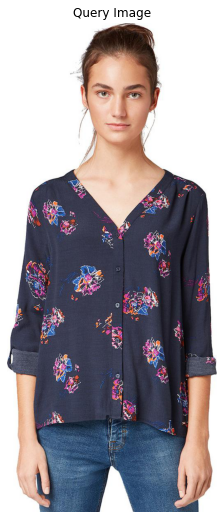

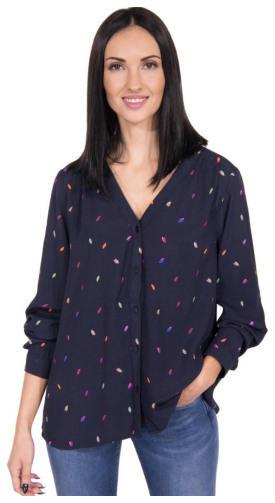

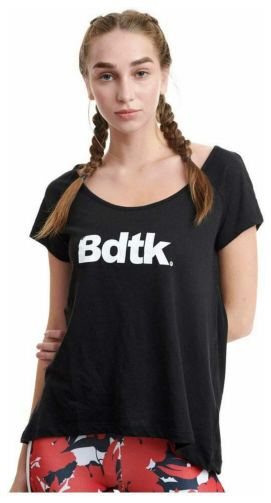

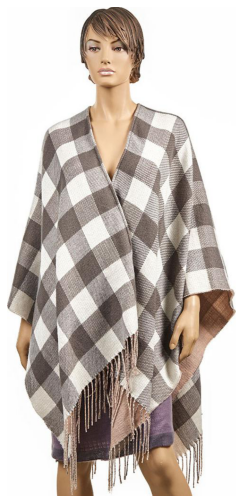

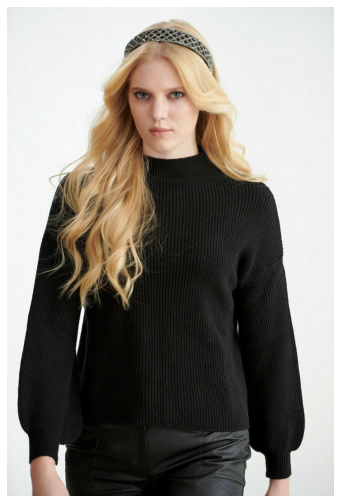

...

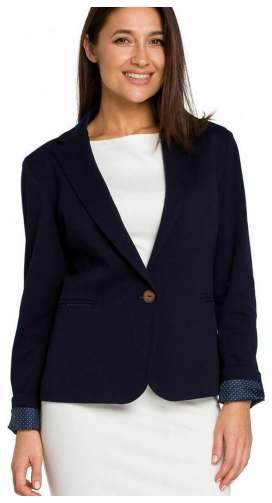

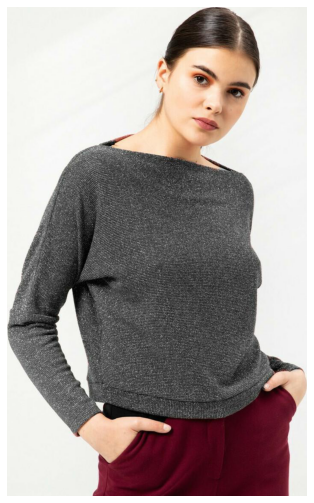

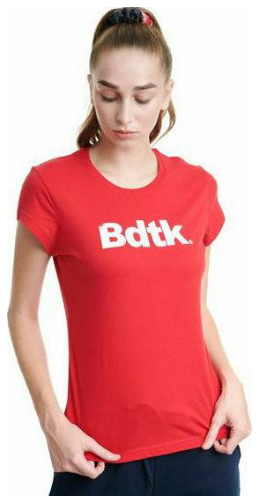

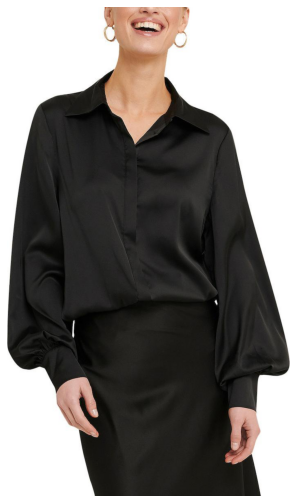

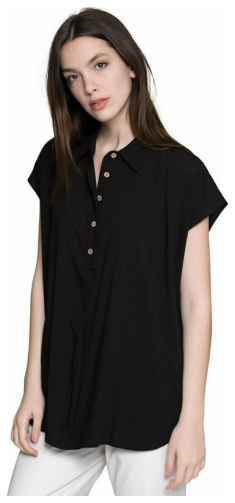

In [ ]:
tqdm.pandas()
query_embedding = womens_topwear.iloc[random.randint(0,womens_topwear.shape[0])].embedding
womens_topwear['distance'] = womens_topwear['embedding'].progress_apply(lambda x: np.linalg.norm(np.asarray(eval(x), dtype=np.float32) - np.asarray(eval(query_embedding), dtype=np.float32)))
womens_topwear = womens_topwear.sort_values(by='distance').reset_index(drop=True)
plt.figure(figsize=(16,9))
plt.imshow(io.imread(womens_topwear.iloc[0].image_path))
plt.title("Query Image")
plt.axis("off");plt.show()
print(254*"=")
print(254*"=")
for i, row in womens_topwear.iloc[1:11].iterrows():
    plt.figure(figsize=(16,9))
    image = io.imread(row["image_path"])
    plt.imshow(image);plt.axis("off")
    plt.show()
    print(254*"=")

***
***

<a class="anchor" id="6"></a> 



<img src="https://i.ibb.co/82xghNf/pipeline.png" alt="Final Pipeline" style="width: 660px;"/><br /> 

<b> <font size="+3"><span style='font-family:Verdana '>Combining All Modules Together </b> 


* The final step is to combine all the modules into a pipeline that takes in a query image and outputs the relevant recommendations

In [ ]:
from google.colab import drive
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import tensorflow as tf
from PIL import Image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import resnet
import matplotlib.pyplot as plt
from skimage import io
%matplotlib inline
!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 11718, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 11718 (delta 31), reused 36 (delta 14), pack-reused 11632
Receiving objects: 100% (11718/11718), 12.45 MiB | 5.57 MiB/s, done.
Resolving deltas: 100% (8027/8027), done.


In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
LOADED_MODELS = dict()
LOADED_CSVS = dict()
TARGET_SHAPE = (224,224,3)

<b> <font size="+3"><span style='font-family:Verdana '>Functions </b> 
* Explanations:



> *   `preprocess_image1` : Loads the specified file as a JPEG image, preprocess it and resize it to the target shape for Gender Classification
>
> *   `preprocess_image2` : Loads the specified file as a JPEG image, preprocess it and resize it to the target shape for Embedding Generation
>
>*   `load_models` : Loads gender classifier model , and embeddings generaton models for the recommendation engine pipeline
>
>*   `load_CSVs` :  Loads all the Skroutz images embeddings stored in CSV files
>
>*   `extract_clothes` : Extracts Topwear, Bottomwear and Footwear from a given Image
>
>*   `plot_clothes` : Plots the extracted clothes of the given image
>
>*  `generate_embedding` : Generate the embeddings for cropped outputs
>
>*  `__get__` :  Plots top 3 similar products for each category
>
>*   `get_results` : get Similar products for a given input containing query product
>
>*   `final` : The complete pipeline for recommending similar fashion products based on a query image.







In [ ]:
def preprocess_image1(filename):
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    return tf.expand_dims(image, axis=0)

def preprocess_image2(filename):
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    image = resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0)

def load_models():
    if len(LOADED_MODELS) == 4:
        return True
    else:
        print("Loading Models...")
        GENDER_CLASSIFIER = load_model("/content/drive/MyDrive/shop_the_look/gender_classification_model.h5")
        TOPWEAR_EMBEDDING = load_model("/content/drive/MyDrive/shop_the_look/topwear_embedding.h5")
        BOTTOMWEAR_EMBEDDING = load_model("/content/drive/MyDrive/shop_the_look/bottomwear_embedding.h5")
        FOOTWEAR_EMBEDDING = load_model("/content/drive/MyDrive/shop_the_look/footwear_embedding.h5")

        LOADED_MODELS["gender_classifier"] = GENDER_CLASSIFIER
        LOADED_MODELS["topwear"] = TOPWEAR_EMBEDDING
        LOADED_MODELS["bottomwear"] = BOTTOMWEAR_EMBEDDING
        LOADED_MODELS["footwear"] = FOOTWEAR_EMBEDDING
        print("Models Loaded!")
        return True
    
def load_CSVs():
    if len(LOADED_CSVS) == 6:
        return True
    else:
        print("Loading CSVs...")
        MENS_TOPWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_topwear_embeddings.csv")
        MENS_BOTTOMWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_bottomwear_embeddings.csv")
        MENS_FOOTWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/mens_footwear_embeddings.csv")
        WOMENS_TOPWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_topwear_embeddings.csv")
        WOMENS_BOTTOMWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_bottomwear_embeddings.csv")
        WOMENS_FOOTWEAR_CSV = pd.read_csv("/content/drive/MyDrive/shop_the_look/womens_footwear_embeddings.csv")
        
        LOADED_CSVS["mens_topwear"] = MENS_TOPWEAR_CSV
        LOADED_CSVS["mens_bottomwear"] = MENS_BOTTOMWEAR_CSV
        LOADED_CSVS["mens_footwear"] = MENS_FOOTWEAR_CSV
        LOADED_CSVS["womens_topwear"] = WOMENS_TOPWEAR_CSV
        LOADED_CSVS["womens_bottomwear"] = WOMENS_BOTTOMWEAR_CSV
        LOADED_CSVS["womens_footwear"] = WOMENS_FOOTWEAR_CSV
        print("CSVs Loaded!")
        return True
    
def extract_clothes(img_path: str): 
    import torch
    %cd yolov5
    model = torch.hub.load('.', 'custom', path='/content/drive/MyDrive/shop_the_look/object_detection.pt', source='local') 
    image = plt.imread(img_path)
    results = model(image)
    topwear_score, bottomwear_score, footwear_score = 0.5, 0.5, 0.5
    outputs = {"original_image": image}
    for index, row in results.pandas().xyxy[0].iterrows():
      XMIN = int(row['xmin'])
      YMIN = int(row['ymin']) 
      XMAX = int(row['xmax'])
      YMAX = int(row['ymax'])
      if (row['class'] == 0) and (row['confidence'] > topwear_score) :
          outputs["topwear"] = image[YMIN:YMAX, XMIN:XMAX]
      elif (row['class'] == 1) and (row['confidence'] > bottomwear_score):
          outputs["bottomwear"] = image[YMIN:YMAX, XMIN:XMAX]
      elif (row['class'] == 2) and (row['confidence'] > footwear_score):
          outputs["footwear"] = image[YMIN:YMAX, XMIN:XMAX]
    %cd '/content/drive/MyDrive/shop_the_look'
    return outputs


def plot_clothes(**images):
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
      plt.subplot(1, n, i + 1)
      plt.axis("off")
      plt.title(' '.join(name.split('_')).title())
      plt.imshow(image)
    plt.show()
    
def generate_embedding(outputs, detected_objects):
    for output in detected_objects:
        image = outputs[output]
        img_path = os.path.join("/content/","example.jpg")
        saved_image = Image.fromarray(image)
        saved_image.save(img_path)
        image = preprocess_image2(img_path)
        embedding = LOADED_MODELS[output](image)[0].numpy().astype(np.float32).tolist()
        outputs[output+"_embedding"] = embedding
        os.remove(img_path)
    return outputs

def __get__(csv_file, query):
    csv_file['distance'] = csv_file['embedding'].apply(lambda x: np.linalg.norm(np.asarray(eval(x), dtype=np.float32) - np.asarray(query, dtype=np.float32)))
    csv_file = csv_file.sort_values(by='distance').reset_index(drop=True)
    result = csv_file.iloc[:3][['product_id', 'image_path']].to_dict('records')
    for i, row in csv_file.iloc[:3].iterrows():
        plt.figure(figsize=(16,9))
        image = io.imread("/content/drive/MyDrive/shop_the_look/"+row["image_path"])
        plt.imshow(image);plt.axis("off");plt.show()
        #print("Shop Now @ ", row["product_id"])
        print(254*"=")
    return result

def get_results(outputs, gender, detected_objects):
    dict_results = dict()
    for output in detected_objects:
        csv_file = gender + "_" + output
        csv_file = LOADED_CSVS[csv_file].copy(deep=True)
        query = outputs[output+"_embedding"]
        dict_results[output] = __get__(csv_file, query)
    return dict_results

def final(images):
    if isinstance(images, str):
        images = [images]
    if load_models() and load_CSVs():
        for img_path in images:
            inputs = preprocess_image1(img_path)
            gender_score = LOADED_MODELS["gender_classifier"](inputs)[0][0].numpy()
            gender = "mens" if  gender_score < 0.5 else "womens"
            print(gender)
            outputs = extract_clothes(img_path)
            detected_objects = [k for k in outputs if k != "original_image"]
            plot_clothes(**outputs)
            outputs = generate_embedding(outputs, detected_objects)
            results = get_results(outputs, gender, detected_objects)

<b> <font size="+3"><span style='font-family:Verdana '>Testing the Pipeline </b> 

* Lets now test the whole pipeline by giving as input random images from the web ( test_image_1.jpg, test_image_2.jpeg, test_image_3.jpg, test_image_4.jpg ) 

<b> <font size="+3"><span style='font-family:Verdana '>| Example A </b> 

womens
/content/drive/MyDrive/shop_the_look/yolov5


requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: ipython not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 2 packages updated per /content/drive/MyDrive/shop_the_look/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


/content/drive/MyDrive/shop_the_look


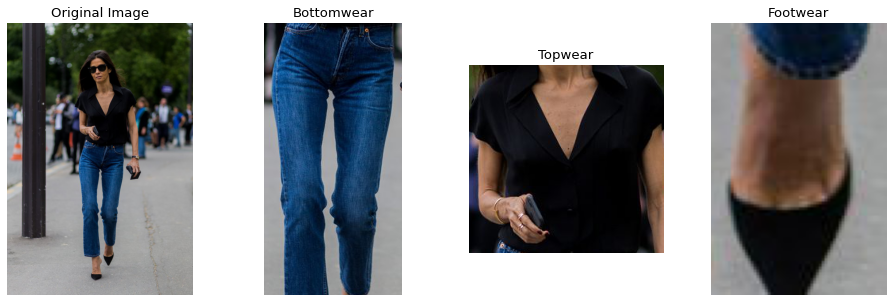

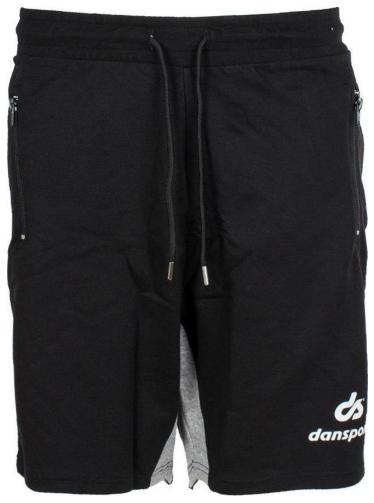

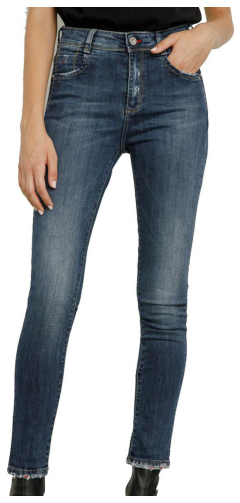

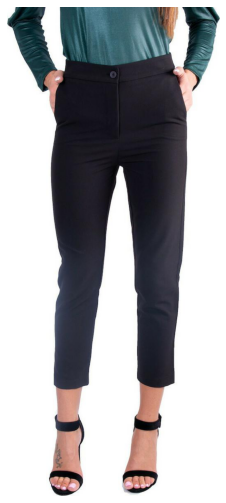

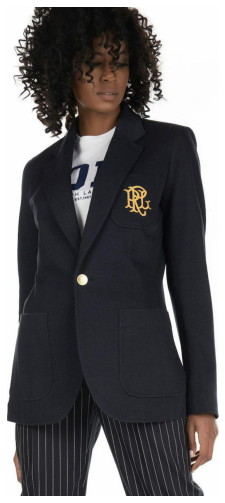

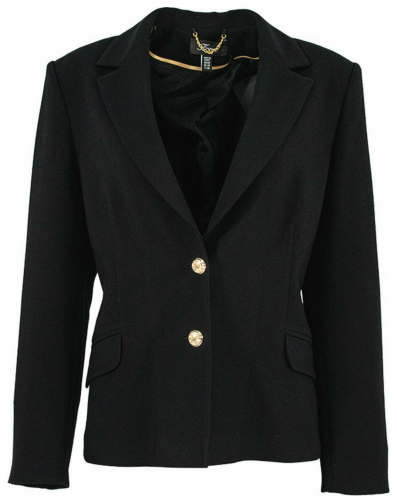

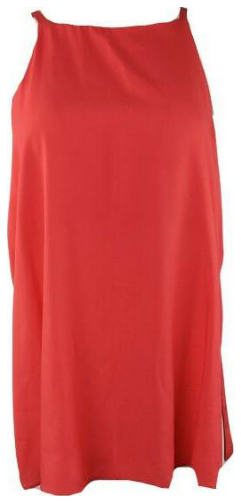

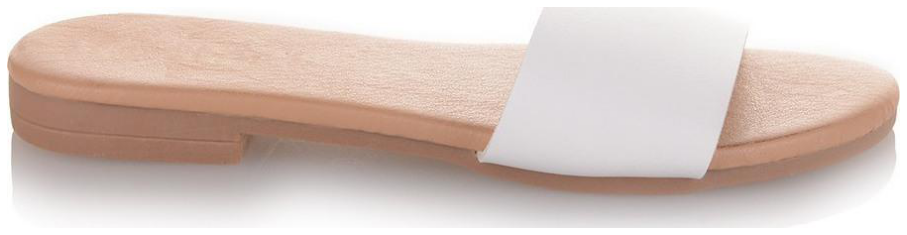

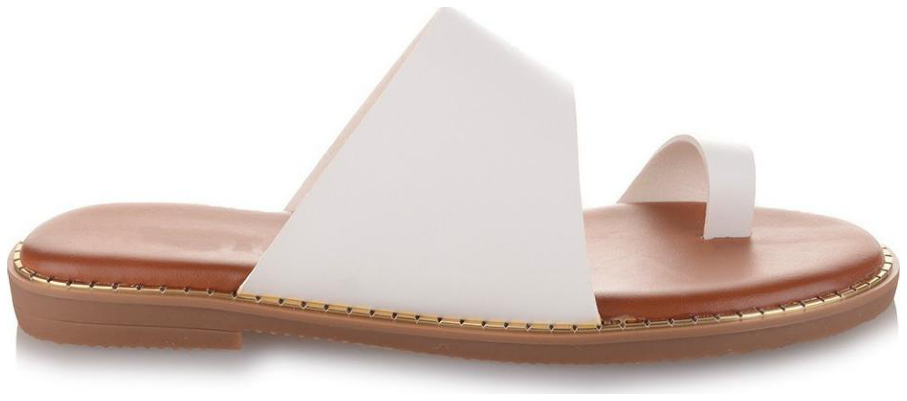

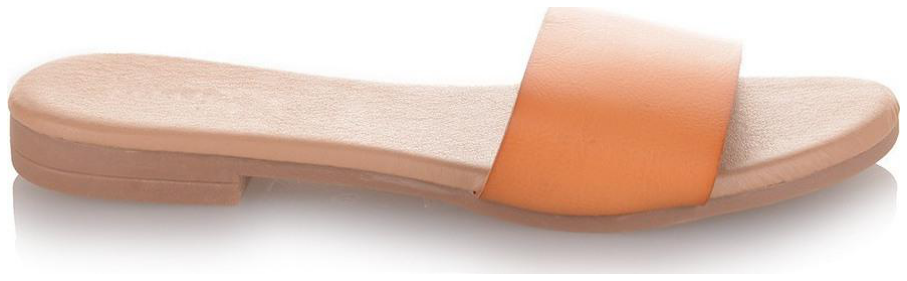

In [ ]:
img_path = "/content/drive/MyDrive/shop_the_look/test_image_1.jpg"
final(img_path)

<b> <font size="+3"><span style='font-family:Verdana '>| Example B </b> 

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


mens
/content/drive/MyDrive/shop_the_look/yolov5


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /content/drive/MyDrive/shop_the_look/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


/content/drive/MyDrive/shop_the_look


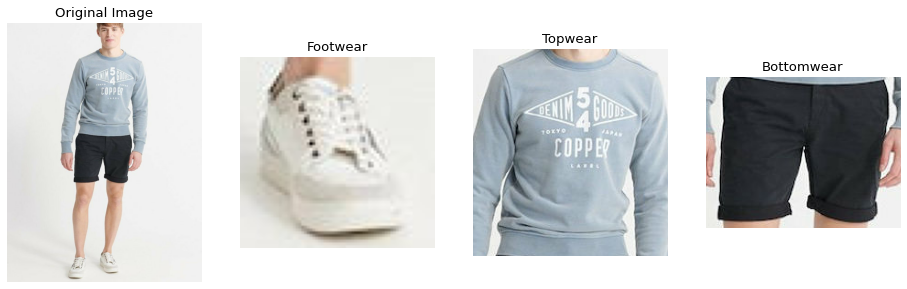

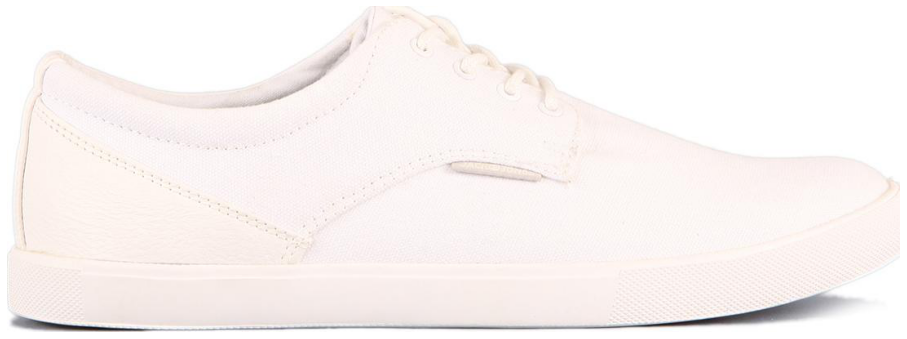

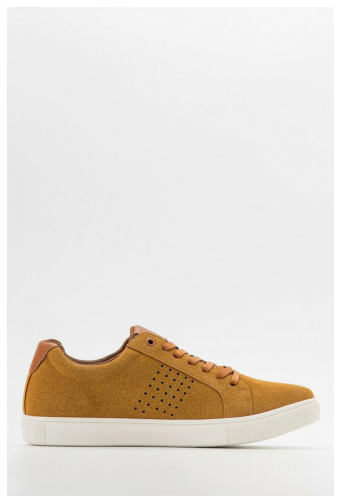

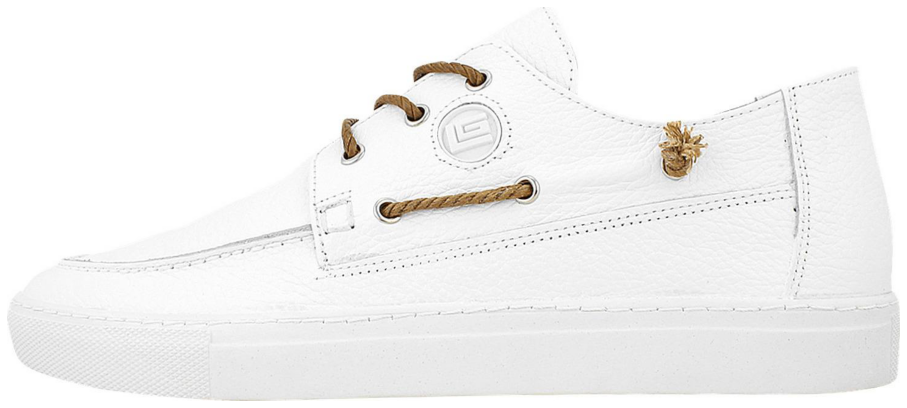

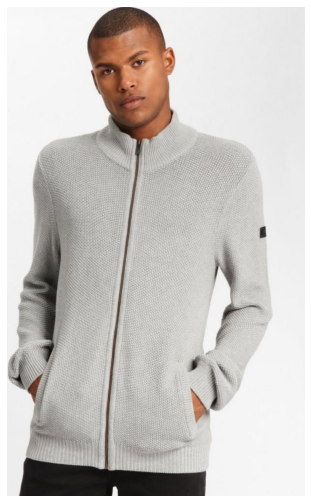

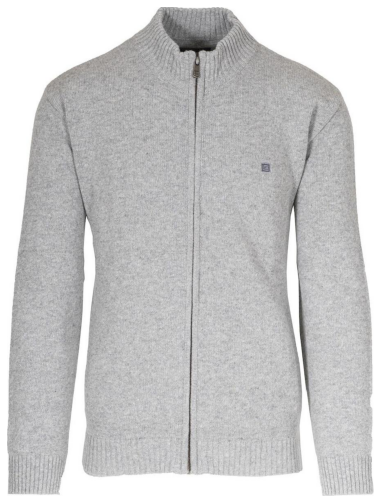

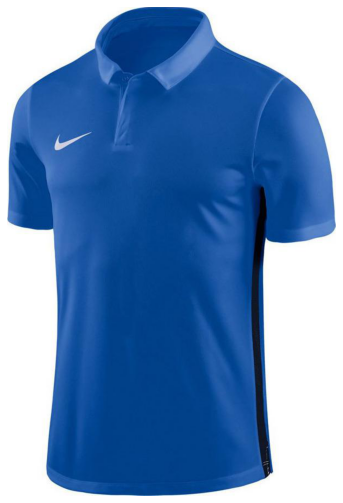

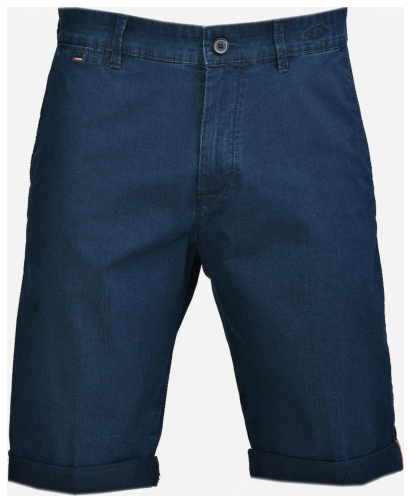

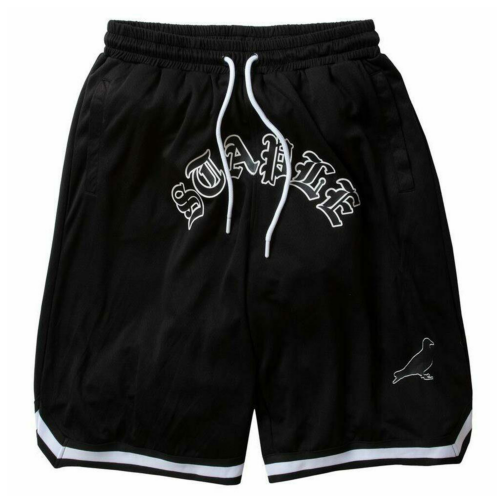

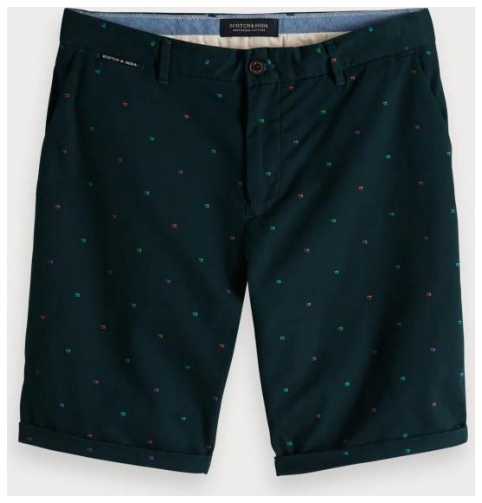

In [ ]:
img_path = "/content/drive/MyDrive/shop_the_look/test_image_2.jpeg"
final(img_path)

<b> <font size="+3"><span style='font-family:Verdana '>| Example C </b> 

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


womens
/content/drive/MyDrive/shop_the_look/yolov5


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /content/drive/MyDrive/shop_the_look/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


/content/drive/MyDrive/shop_the_look


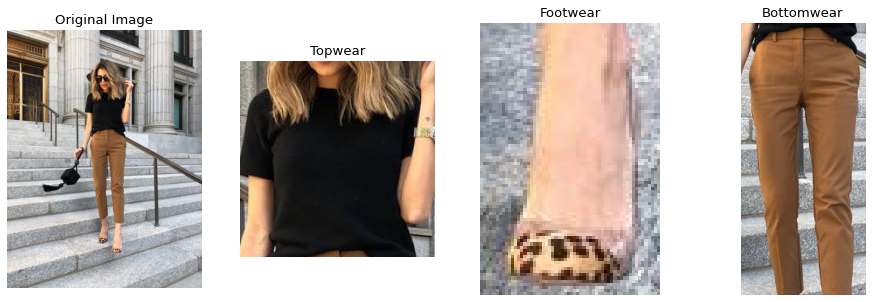

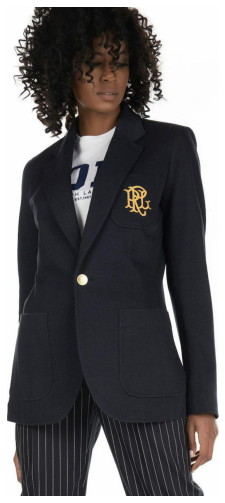

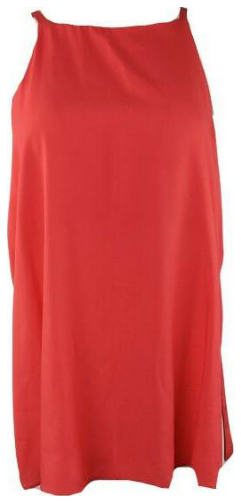

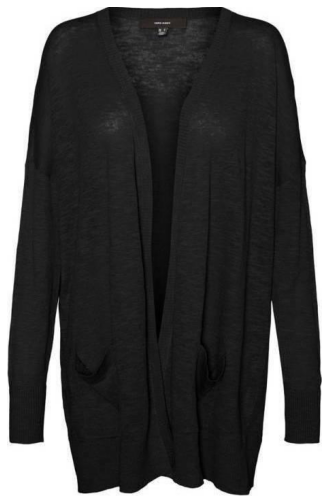

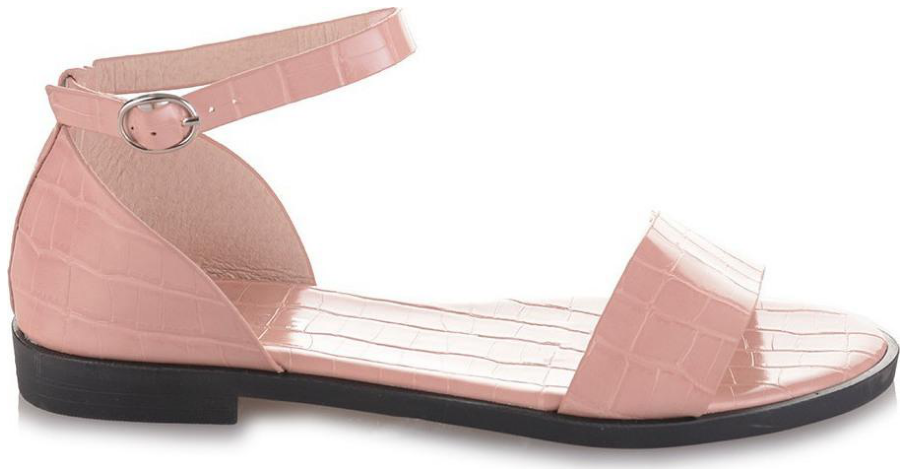

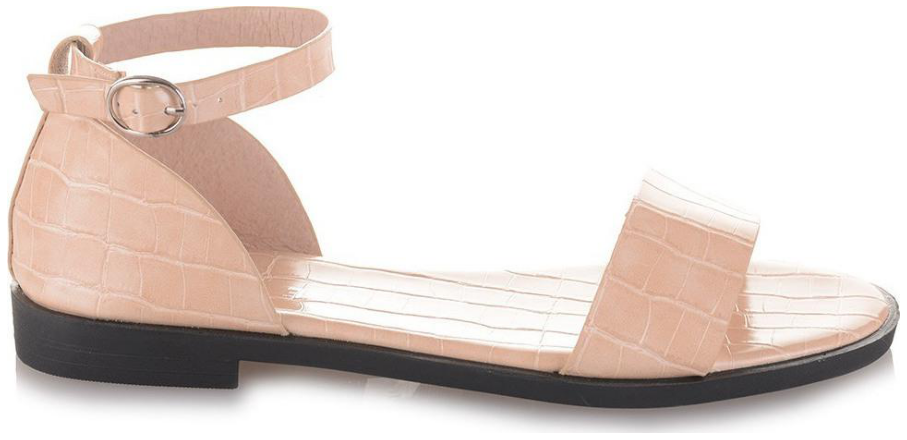

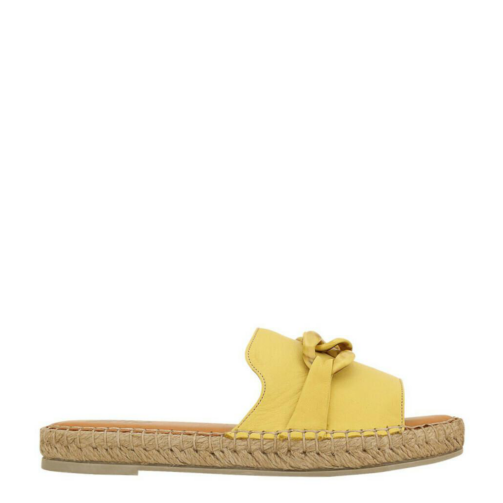

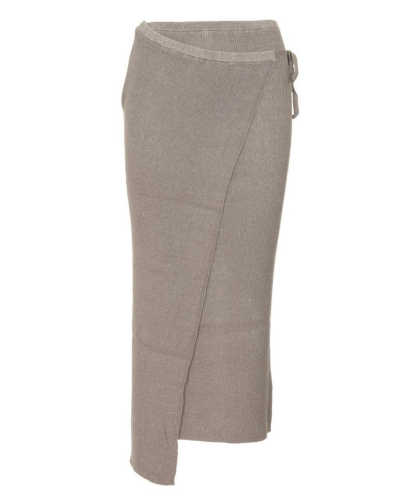

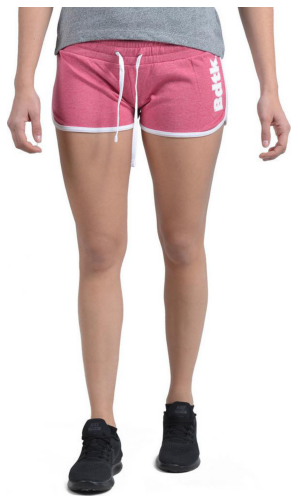

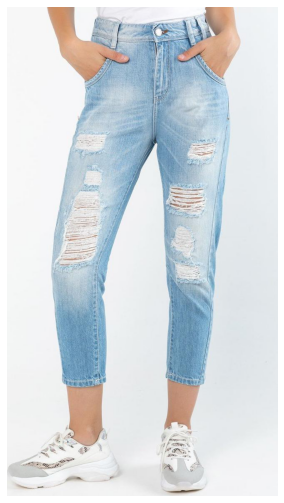

In [ ]:
img_path = "/content/drive/MyDrive/shop_the_look/test_image_3.jpg"
final(img_path)

<b> <font size="+3"><span style='font-family:Verdana '>| Example D </b> 

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


womens
/content/drive/MyDrive/shop_the_look/yolov5


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /content/drive/MyDrive/shop_the_look/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


/content/drive/MyDrive/shop_the_look


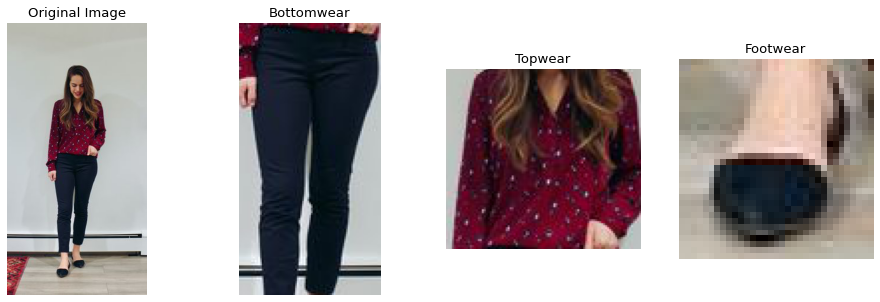

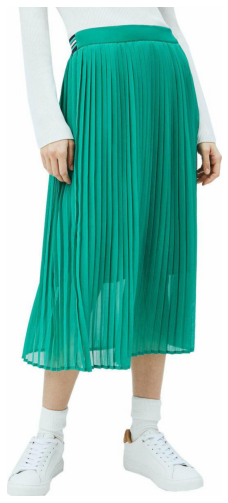

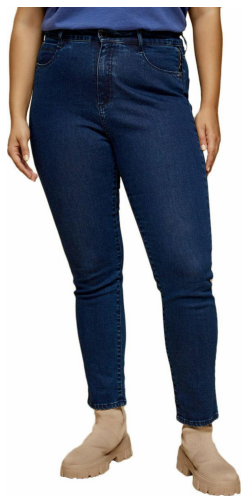

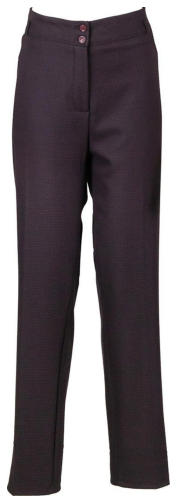

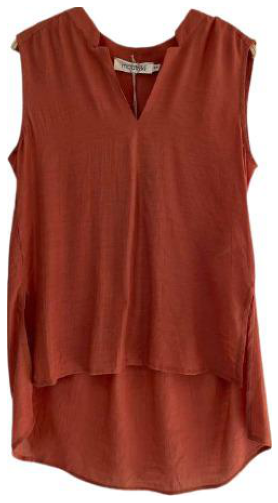

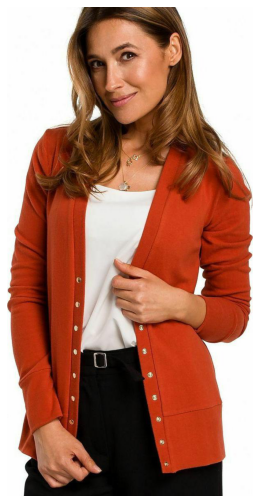

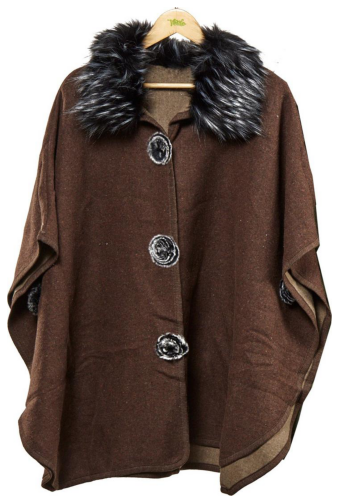

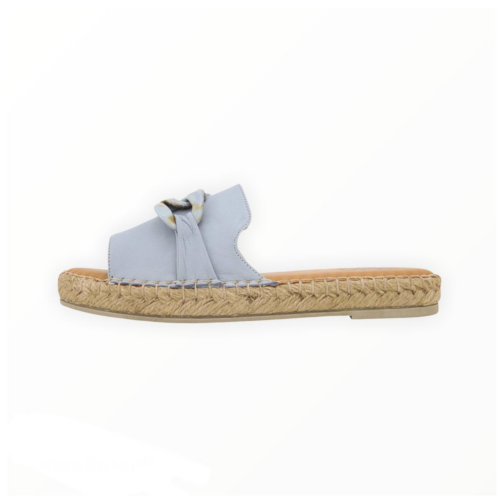

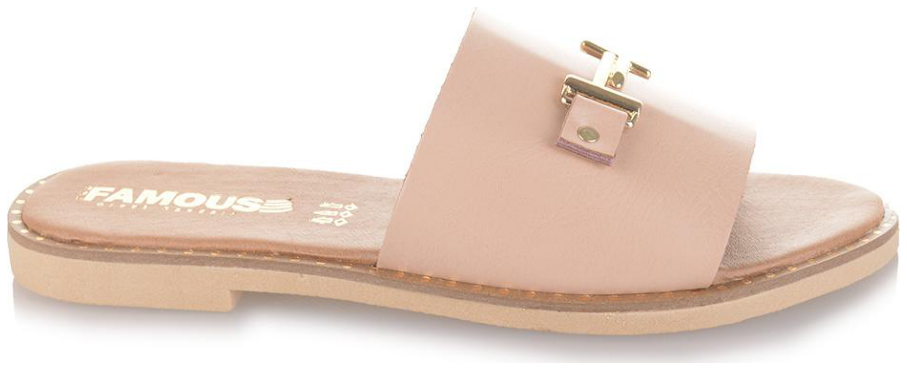

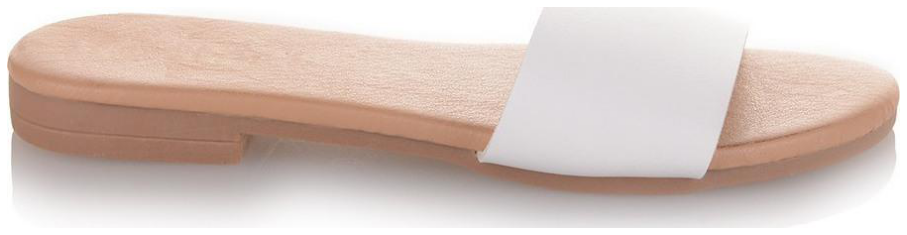

In [ ]:
img_path = "/content/drive/MyDrive/shop_the_look/test_image_4.jpg"
final(img_path)

<b> <font size="+3"><span style='font-family:Verdana '>| Example E </b> 

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


mens
/content/drive/MyDrive/shop_the_look/yolov5


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /content/drive/MyDrive/shop_the_look/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


/content/drive/MyDrive/shop_the_look


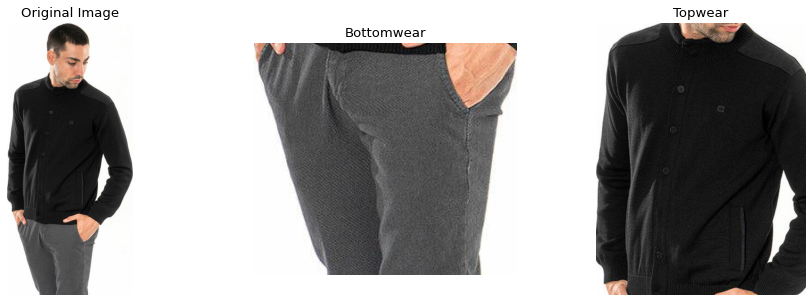

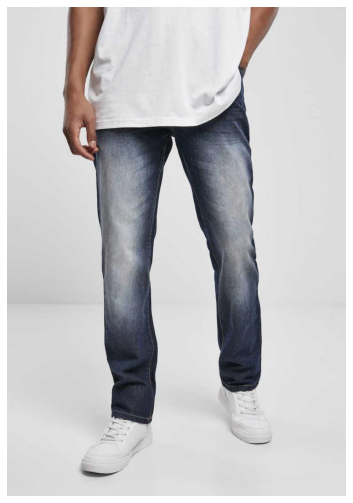

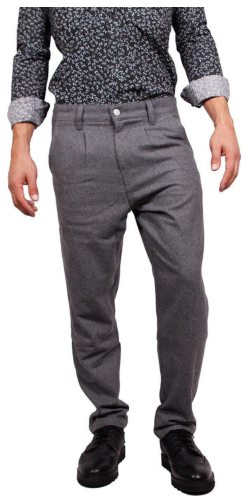

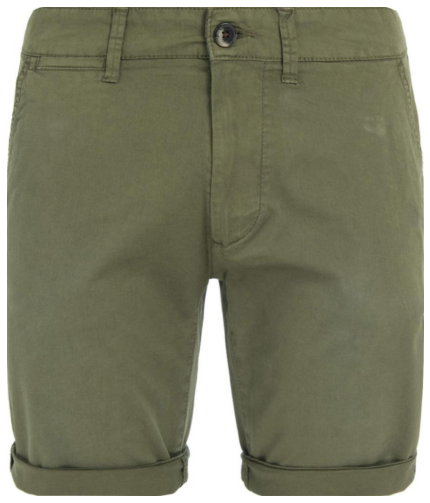

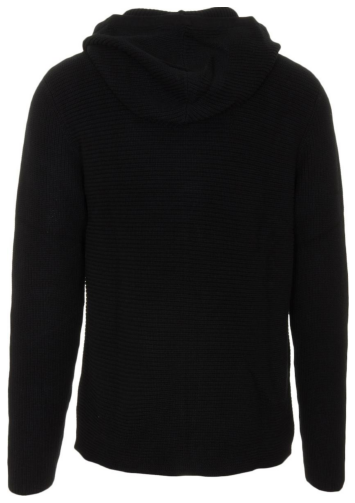

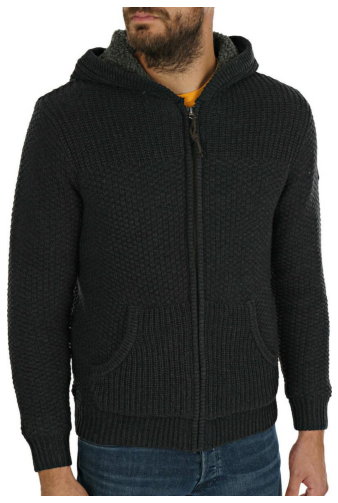

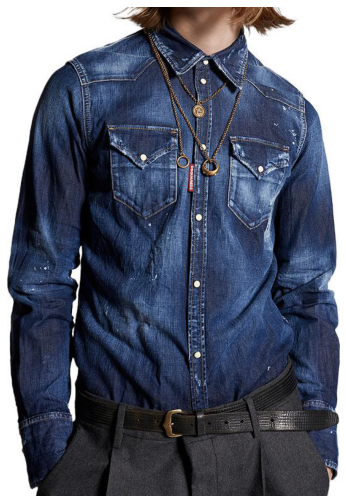

In [ ]:
img_path = "/content/drive/MyDrive/shop_the_look/men_topwear/mtw_29222194.jpeg"
final(img_path)

In [ ]:
%%html 
<font size="+5">
<marquee style='width: 90%; color: orange;'><b>🙏 THE END ~ WHISKEY TEAM ~ 2022 ~ SHOP THE LOOK 🙏</b></marquee>

***

[Back to Top ↑](#00) <img style="float: right;" src="https://i.ibb.co/w7Lbd0X/2-AUEB-white-HR.jpg"  alt="aueb" width="550px"/>

In [ ]:
░░░┌┐░░░░░░░░░┌┐┌┐░░░░░┌┐░░░░░░░░┌┐░░░░░░░░░░░░░░░░░░┌┐░░
░░░││░░░░░░░░┌┘└┤│░░░░░││░░░░░░░░││░░░░░░░░░░░░░░░░░░││░░
┌──┤└─┬──┬──┐└┐┌┤└─┬──┐││░░┌──┬──┤│┌┐░░░░░░░┌──┬┐┌┬──┤└─┐
│──┤┌┐│┌┐│┌┐│░│││┌┐││─┤││░┌┤┌┐│┌┐│└┘┘┌──┬──┐│┌┐│││││─┤┌┐│
├──││││└┘│└┘│░│└┤││││─┤│└─┘│└┘│└┘│┌┐┐└──┴──┘│┌┐│└┘││─┤└┘│
└──┴┘└┴──┤┌─┘░└─┴┘└┴──┘└───┴──┴──┴┘└┘░░░░░░░└┘└┴──┴──┴──┘
░░░░░░░░░││░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
░░░░░░░░░└┘░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░░
